# Initialization

In [5]:
import os
import sys

In [6]:
import numpy as np
import torch
from torch import nn
import torch.functional as F
import scipy.ndimage as nd
import matplotlib.pyplot as plt

import scgt
from ecoscape_connectivity import compute_connectivity, analyze_tile_torch, analyze_geotiffs, StochasticRepopulateFast

In [7]:
if(torch.cuda.is_available()):
    torch.cuda.set_device(0)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Device:", device)

Device: cpu


# Simulated landscapes

In this notebook, we check our model's sensitivity to the following parameters:
1. Habitat area
2. Number of habitat patches
3. Terrain resistance/goodness
4. Hop distance (dispersal distance)
5. Patch distance (distance between patches)
6. Seed density
7. Number of spreads per simulation
8. Batch size
9. Number of simulations in total

In [8]:
def disp(region, title=None):
    """
    Display the region.
    """
    if (len(region.shape) == 3):
        region = np.squeeze(region)
    r = region
    if isinstance(r, torch.Tensor):
        r = r.cpu().detach().numpy()
    fig, ax = plt.subplots()
    fig.colorbar(ax.imshow(r, cmap="inferno", vmin=0))
    if title:
        plt.title(title)
    plt.show()

## Test habitats and terrains

In [9]:
# TEST HABITATS

# 2 large habitats
hab_1 = np.zeros((140, 140))
hab_1[10:130, 10:50] = 1
hab_1[10:130, 90:130] = 1

# 1 large habitat and 1 small habitat
hab_2 = np.zeros((140, 140))
hab_2[10:130, 10:50] = 1
hab_2[50:90, 110:130] = 1

# 1 large habitat and 3 small habitats
hab_3 = np.zeros((140, 140))
hab_3[10:130, 10:50] = 1
hab_3[10:50, 75:95] = 1
hab_3[50:90, 110:130] = 1
hab_3[90:130, 75:95] = 1

# 2 small habitats
hab_4 = np.zeros((140, 140))
hab_4[50:90, 10:30] = 1
hab_4[50:90, 110:130] = 1

# 4 small habitats
hab_5 = np.zeros((140, 140))
hab_5[50:90, 10:30] = 1
hab_5[50:90, 110:130] = 1
hab_5[10:30, 50:90] = 1
hab_5[110:130, 50:90] = 1

# 6 small square habitats
hab_6 = np.zeros((140, 140))
hab_6[10:40, 40:70] = 1
hab_6[55:85, 10:40] = 1
hab_6[100:130, 40:70] = 1
hab_6[10:40, 100:130] = 1
hab_6[55:85, 70:100] = 1
hab_6[100:130, 100:130] = 1

# 1 large habitat and 3 small habitats (differently sized)
hab_7 = np.zeros((140, 140))
hab_7[10:130, 10:50] = 1
hab_7[10:40, 66:106] = 1
hab_7[56:86, 96:130] = 1
hab_7[106:130, 80:130] = 1

# 16 tiny habitats
hab_8 = np.zeros((140, 140))
hab_8[10:24, 10:30] = 1
hab_8[16:30, 42:62] = 1
hab_8[36:50, 14:34] = 1
hab_8[64:78, 10:30] = 1
hab_8[56:70, 40:60] = 1
hab_8[84:98, 28:48] = 1
hab_8[108:122, 10:30] = 1
hab_8[116:130, 38:58] = 1
hab_8[10:24, 90:110] = 1
hab_8[34:48, 70:90] = 1
hab_8[38:52, 106:126] = 1
hab_8[60:74, 66:86] = 1
hab_8[66:80, 110:130] = 1
hab_8[90:104, 90:110] = 1
hab_8[110:124, 70:90] = 1
hab_8[116:130, 106:126] = 1

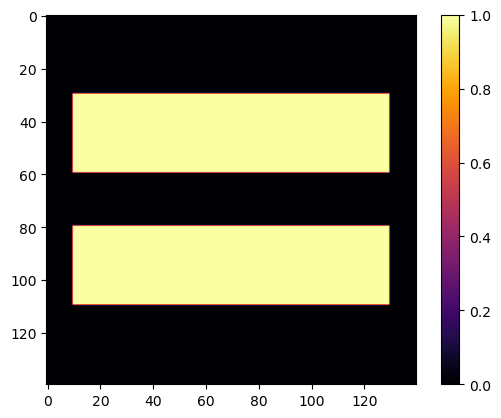

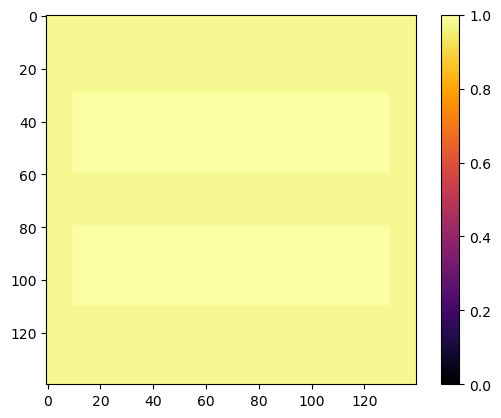

In [10]:
# TEST TERRAIN

# full terrain of resistance 0 / transmittivity 1
ter_1 = np.ones((140, 140))

# 1 bridge with resistance 0 / transmittivity 1, vertically centered
ter_2 = np.zeros((140, 140))
ter_2[55:85, 10:130] = 1

# 2 bridges with resistance 0 / transmittivity 1, vertically centered
ter_3 = np.zeros((140, 140))
ter_3[30:60, 10:130] = 1
ter_3[80:110, 10:130] = 1
disp(ter_3)

# full terrain of resistance 0.05 / transmittivity 0.95
ter_4 = np.full((140, 140), 0.95)

# 1 bridge with resistance 0 / transmittivity 1 over other terrain of transmittivity 0.98, vertically centered
ter_5 = np.full((140, 140), 0.98)
ter_5[55:85, 10:130] = 1

# 2 bridges with resistance 0 / transmittivity 1 over other terrain of transmittivity 0.98, vertically centered
ter_6 = np.full((140, 140), 0.98)
ter_6[30:60, 10:130] = 1
ter_6[80:110, 10:130] = 1
disp(ter_6)

# full terrain of resistance 0.1 / transmittivity 0.9
ter_7 = np.full((140, 140), 0.9)

# full terrain of resistance 1 / transmittivity 0
ter_8 = np.zeros((140, 140))

# full terrain of resistance 0.5 / transmittivity 0.5
ter_9 = np.full((140, 140), 0.5)

# full terrain of resistance 0.5 / transmittivity 0.5
ter_10 = np.full((140, 140), 0.8)

In [11]:
ter_9

array([[0.5, 0.5, 0.5, ..., 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, ..., 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, ..., 0.5, 0.5, 0.5],
       ...,
       [0.5, 0.5, 0.5, ..., 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, ..., 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, ..., 0.5, 0.5, 0.5]])

## Setup

In [12]:
def disp_simulation(hab, ter, repop, grad, title, large_output):
    """
    Display habitat, the max of habitat/terrain, repopulation, and gradient
    for a certain habitat/terrain combination.
    large_output: set to true to enlarge the output graphs
    """
    fig, ax = plt.subplots(2, 2, figsize=(10, 10)) if large_output else plt.subplots(2, 2, figsize=(7, 7))
    fig.suptitle(title, fontsize=16)

    ax[0, 0].set_title('Habitat', fontsize=14)
    fig.colorbar(ax[0, 0].imshow(hab, cmap="inferno", vmin=0), ax=ax[0, 0])
    ax[0, 1].set_title('Max of Hab/Ter', fontsize=14)
    fig.colorbar(ax[0, 1].imshow(np.maximum(hab, ter), cmap="inferno", vmin=0), ax=ax[0, 1])
    ax[1, 0].set_title('Repopulation', fontsize=14)
    fig.colorbar(ax[1, 0].imshow(repop, cmap="inferno", vmin=0), ax=ax[1, 0])
    ax[1, 1].set_title('Gradient', fontsize=14)
    fig.colorbar(ax[1, 1].imshow(grad, cmap="inferno", vmin=0), ax=ax[1, 1])

    for axes in ax.flat:
        axes.label_outer()
    plt.show()

def simulate(hab=hab_1, ter=ter_1,
             seed_density=4.0, batch_size=5, total_spreads=100, num_simulations=100, hop_length=1,
             title="", large_output=False):
    """
    Function that makes simulating and displaying repopulation easier.
    """

    # analyze_tile expects the habitat to be of shape (1, w, h)
    if np.ndim(hab) == 2:
        hab = np.expand_dims(hab, axis=0)

    repopulate = analyze_tile_torch(device=device,
            produce_gradient=True,
            seed_density=seed_density,
            batch_size=batch_size,
            total_spreads=total_spreads,
            num_simulations=num_simulations,
            hop_length=hop_length)

    repop, grad = repopulate(hab, ter)

    # a bit of reshaping for displaying with matplotlib
    hab = np.sum(hab, 0)
    repop = np.sum(repop.detach().cpu().numpy(), 0)
    grad = np.log2(1 + np.sum(grad.detach().cpu().numpy(), 0))

    disp_simulation(hab, ter, repop, grad, title, large_output)

    return (repop, grad)

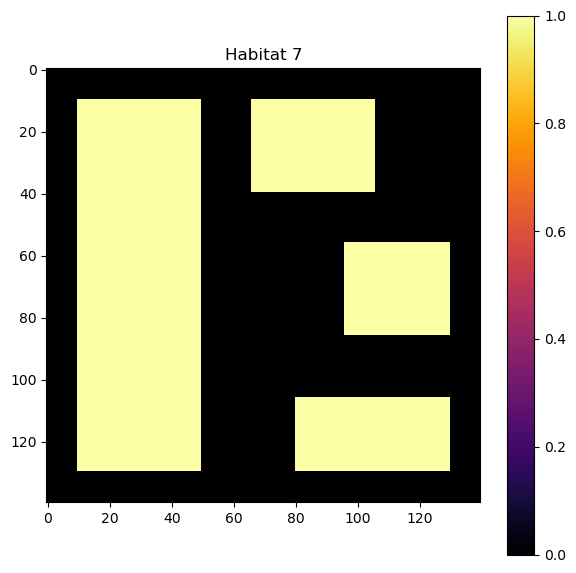

In [13]:
plt.rcParams["figure.figsize"] = (7, 7)

# repopulation.disp(hab_1, "Habitat 1")
# repopulation.disp(hab_2, "Habitat 2")
# repopulation.disp(hab_3, "Habitat 3")
# repopulation.disp(hab_4, "Habitat 4")
# repopulation.disp(hab_5, "Habitat 5")
# repopulation.disp(hab_6, "Habitat 6")
disp(hab_7, "Habitat 7")
# repopulation.disp(hab_8, "Habitat 8")

# repopulation.disp(ter_1, "Terrain 1")
# repopulation.disp(ter_2, "Terrain 2")
# repopulation.disp(ter_3, "Terrain 3")
# repopulation.disp(ter_4, "Terrain 4")
# repopulation.disp(ter_5, "Terrain 5")
# repopulation.disp(ter_6, "Terrain 6")
# repopulation.disp(ter_7, "Terrain 7")
# repopulation.disp(ter_8, "Terrain 8")

## 1. Habitat area

### a. Changing area for 1 of 2 patches

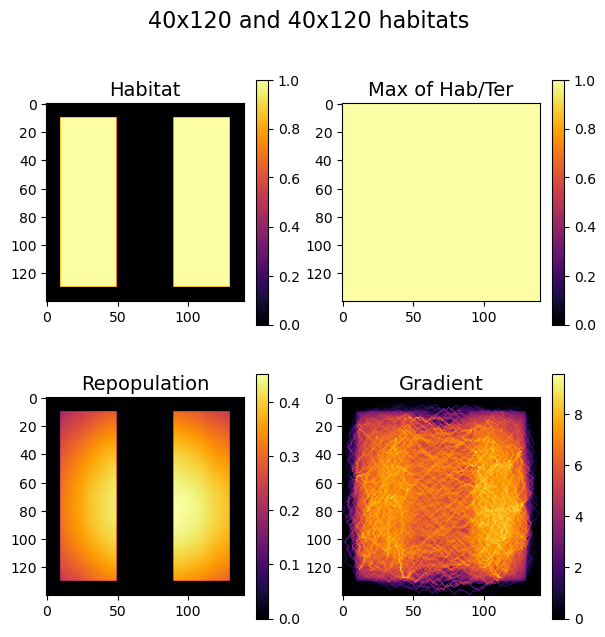

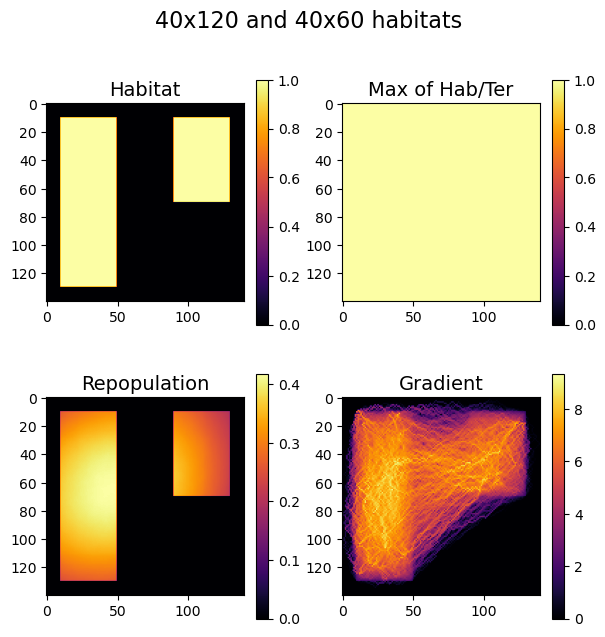

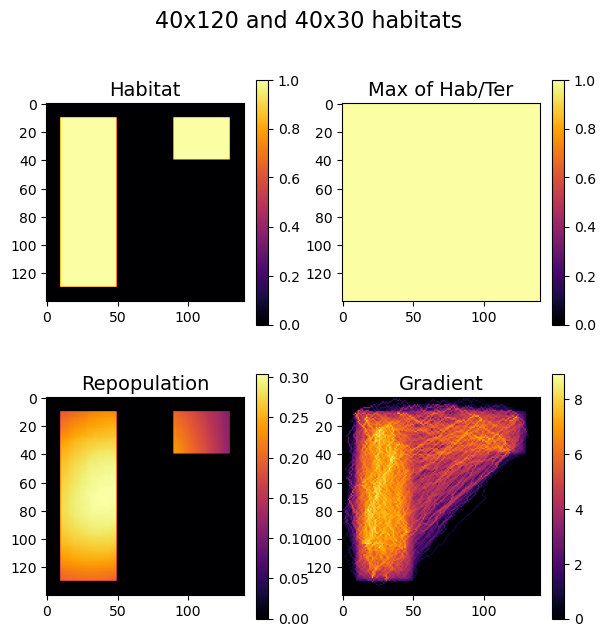

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32))

In [14]:
hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:130, 90:130] = 1
simulate(hab=hab, title="40x120 and 40x120 habitats")
print()

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:70, 90:130] = 1
simulate(hab=hab, title="40x120 and 40x60 habitats")
print()

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:40, 90:130] = 1
simulate(hab=hab, title="40x120 and 40x30 habitats")

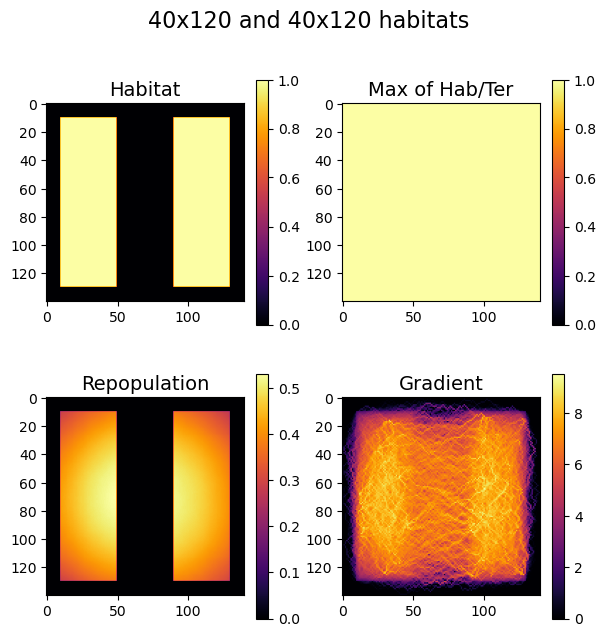

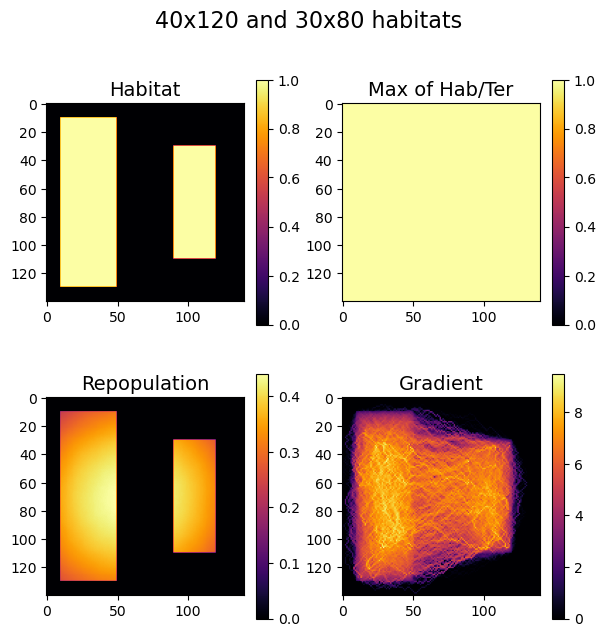

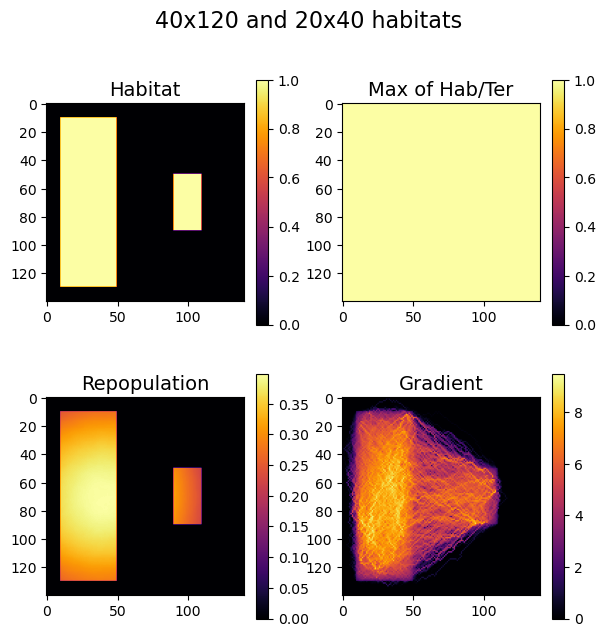

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32))

In [15]:
hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:130, 90:130] = 1
simulate(hab=hab, title="40x120 and 40x120 habitats")
print()

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[30:110, 90:120] = 1
simulate(hab=hab, title="40x120 and 30x80 habitats")
print()

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[50:90, 90:110] = 1
simulate(hab=hab, title="40x120 and 20x40 habitats")

### b. Changing area for 2 of 2 patches

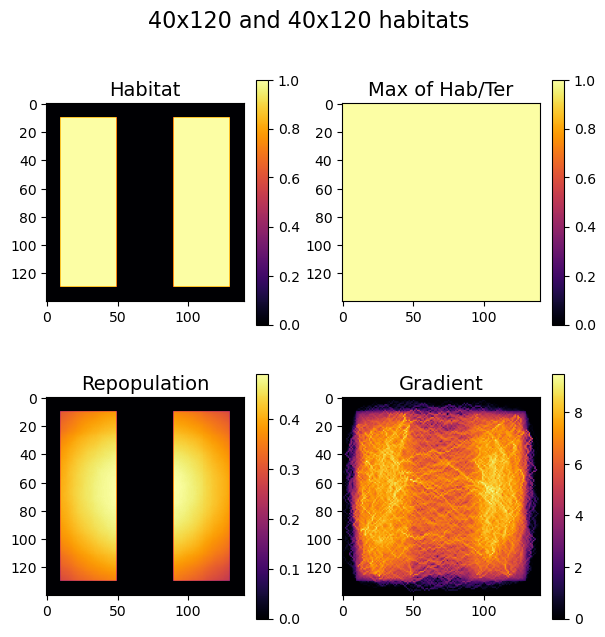

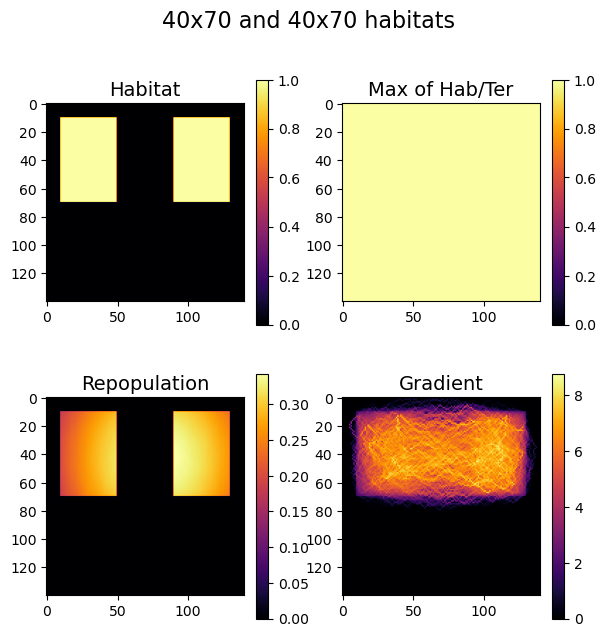

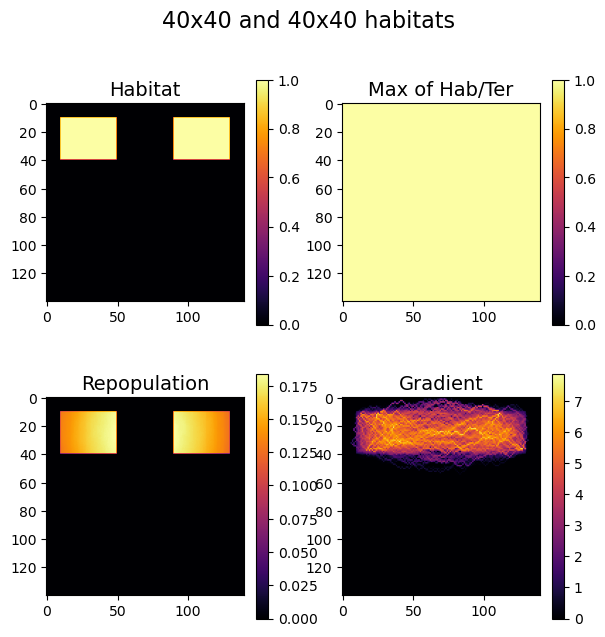

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32))

In [16]:
hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:130, 90:130] = 1
simulate(hab=hab, title="40x120 and 40x120 habitats")
print()

hab = np.zeros((140, 140))
hab[10:70, 10:50] = 1
hab[10:70, 90:130] = 1
simulate(hab=hab, title="40x70 and 40x70 habitats")
print()

hab = np.zeros((140, 140))
hab[10:40, 10:50] = 1
hab[10:40, 90:130] = 1
simulate(hab=hab, title="40x40 and 40x40 habitats")

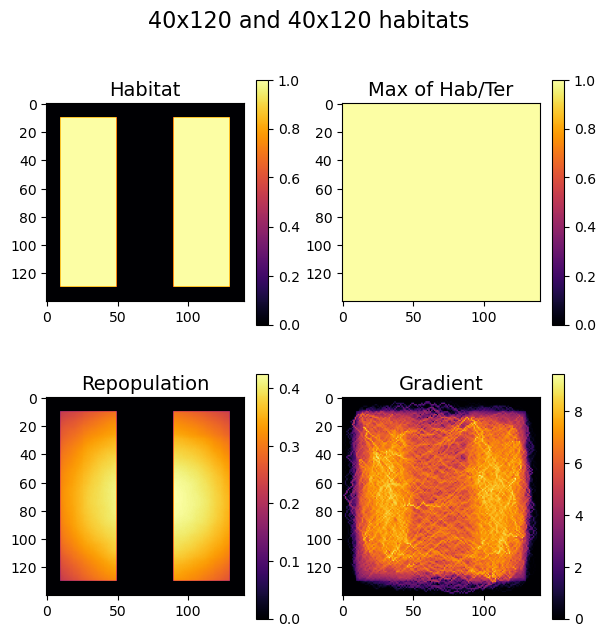

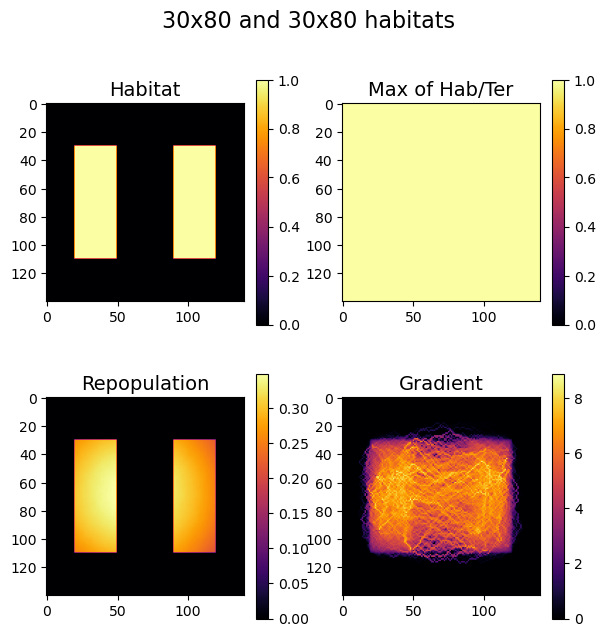

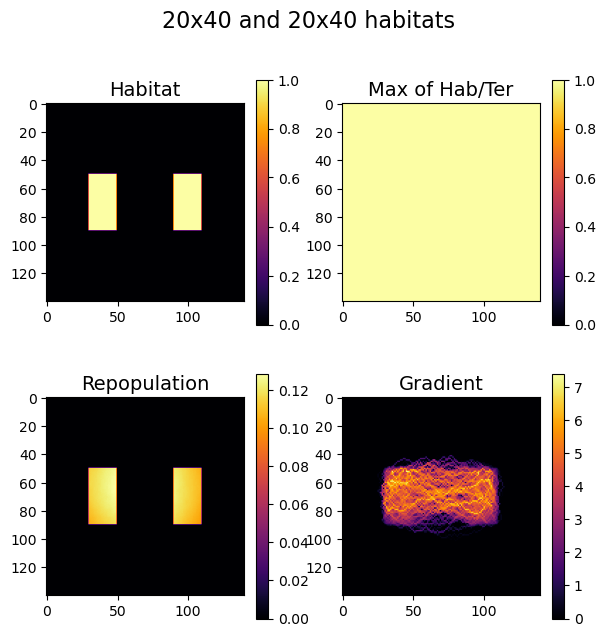

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32))

In [17]:
hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:130, 90:130] = 1
simulate(hab=hab, title="40x120 and 40x120 habitats")
print()

hab = np.zeros((140, 140))
hab[30:110, 20:50] = 1
hab[30:110, 90:120] = 1
simulate(hab=hab, title="30x80 and 30x80 habitats")
print()

hab = np.zeros((140, 140))
hab[50:90, 30:50] = 1
hab[50:90, 90:110] = 1
simulate(hab=hab, title="20x40 and 20x40 habitats")

## 2. Number of habitat patches

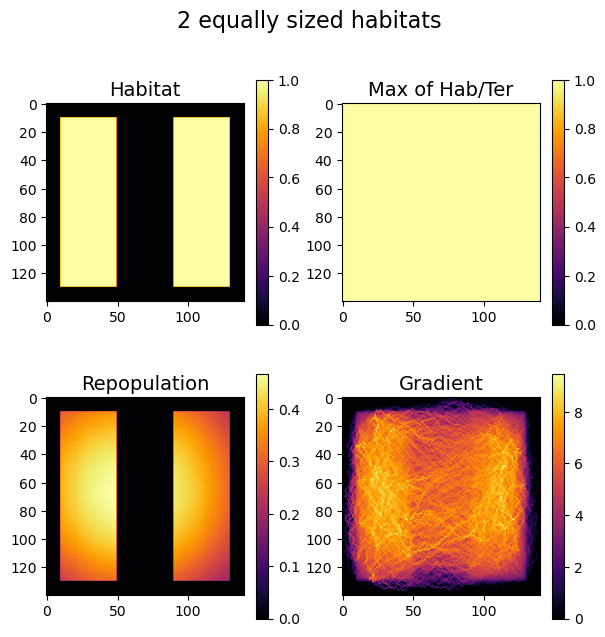

In [18]:
hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:130, 90:130] = 1
simulate(hab=hab, title="2 equally sized habitats")
print()

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:40, 66:106] = 1
hab[56:86, 96:130] = 1
hab[106:130, 80:130] = 1
simulate(hab=hab, title="1 big habitats, 3 small habitats")
print()

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:24, 90:110] = 1
hab[34:48, 70:90] = 1
hab[38:52, 106:126] = 1
hab[60:74, 66:86] = 1
hab[66:80, 110:130] = 1
hab[90:104, 90:110] = 1
hab[110:124, 70:90] = 1
hab[116:130, 106:126] = 1
simulate(hab=hab, title="1 big habitat, 8 tiny habitats")

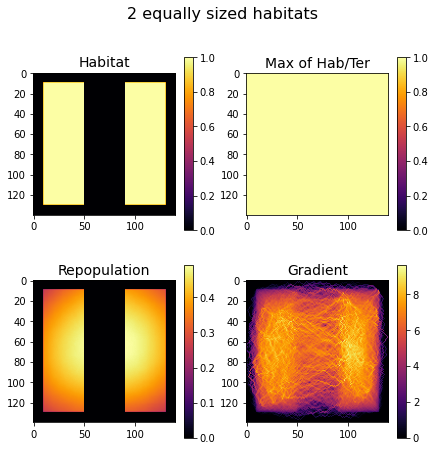

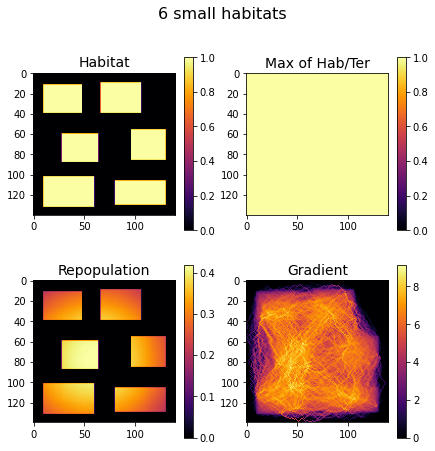

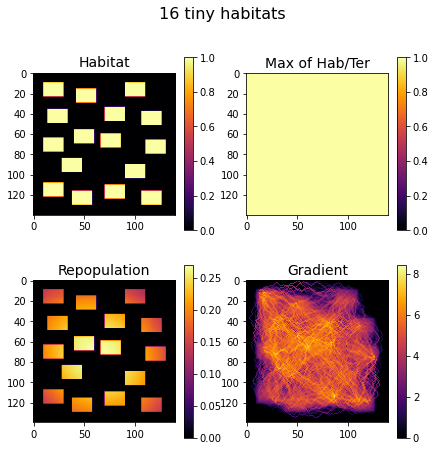

In [ ]:
hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:130, 90:130] = 1
simulate(hab=hab, title="2 equally sized habitats")
print()

hab = np.zeros((140, 140))
hab[12:40, 10:48] = 1
hab[60:88, 28:64] = 1
hab[102:132, 10:60] = 1
hab[10:40, 66:106] = 1
hab[56:86, 96:130] = 1
hab[106:130, 80:130] = 1
simulate(hab=hab, title="6 small habitats")
print()

hab = np.zeros((140, 140))
hab[10:24, 10:30] = 1
hab[16:30, 42:62] = 1
hab[36:50, 14:34] = 1
hab[64:78, 10:30] = 1
hab[56:70, 40:60] = 1
hab[84:98, 28:48] = 1
hab[108:122, 10:30] = 1
hab[116:130, 38:58] = 1
hab[10:24, 90:110] = 1
hab[34:48, 70:90] = 1
hab[38:52, 106:126] = 1
hab[60:74, 66:86] = 1
hab[66:80, 110:130] = 1
hab[90:104, 90:110] = 1
hab[110:124, 70:90] = 1
hab[116:130, 106:126] = 1
simulate(hab=hab, title="16 tiny habitats")

## 3. Terrain resistance/transmittivity

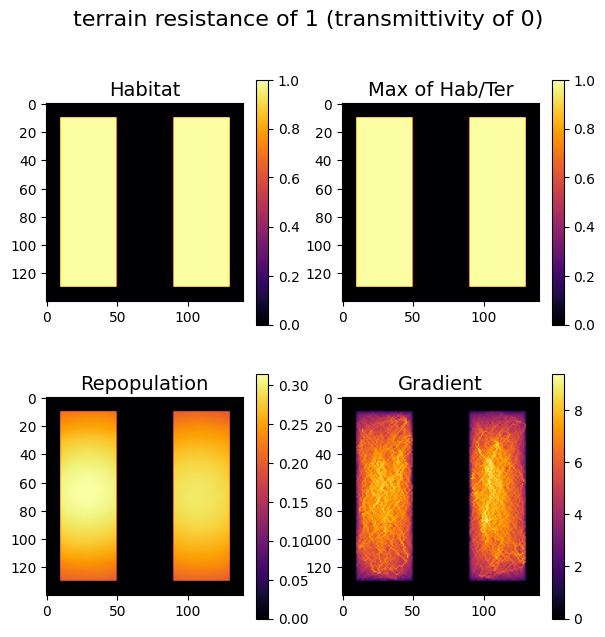

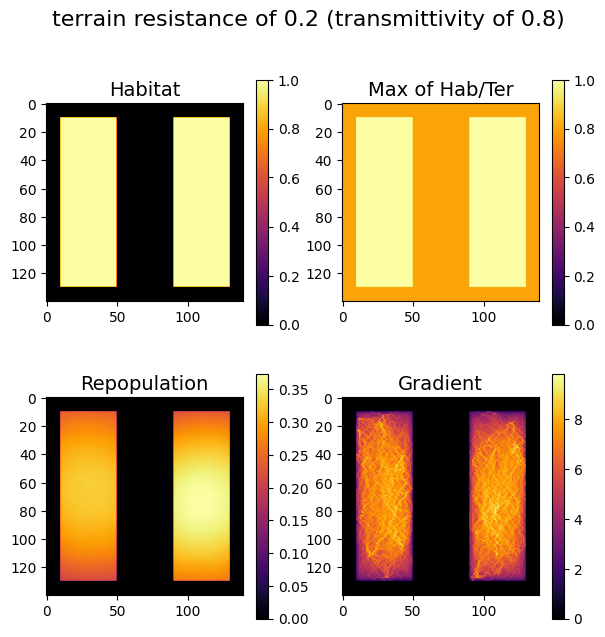

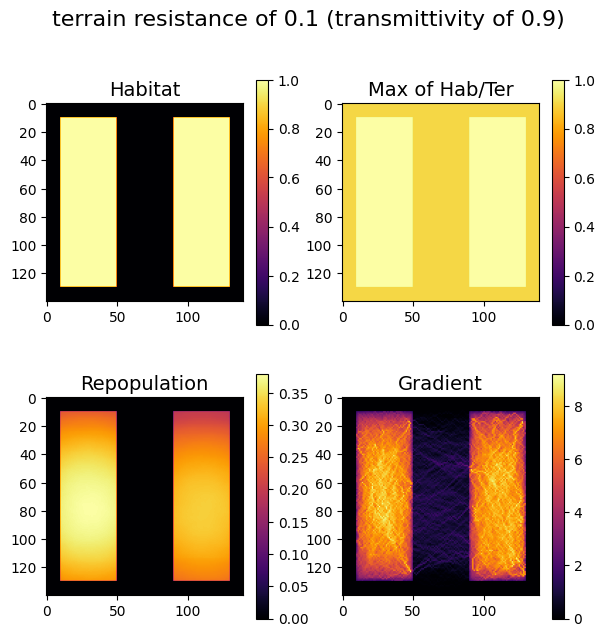

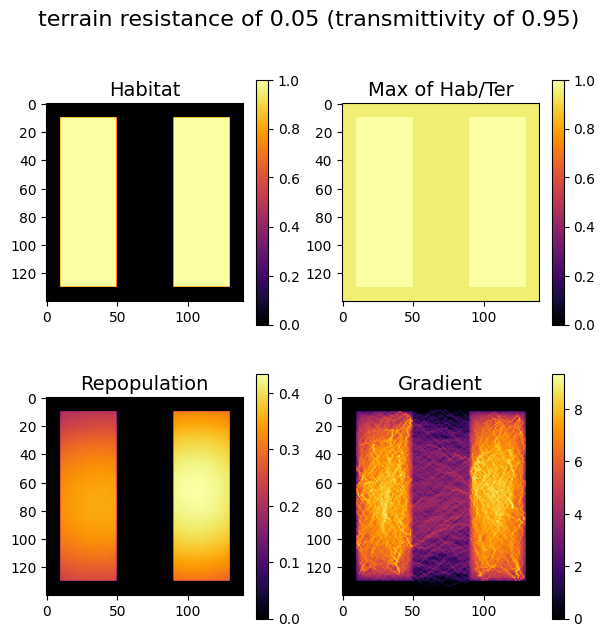

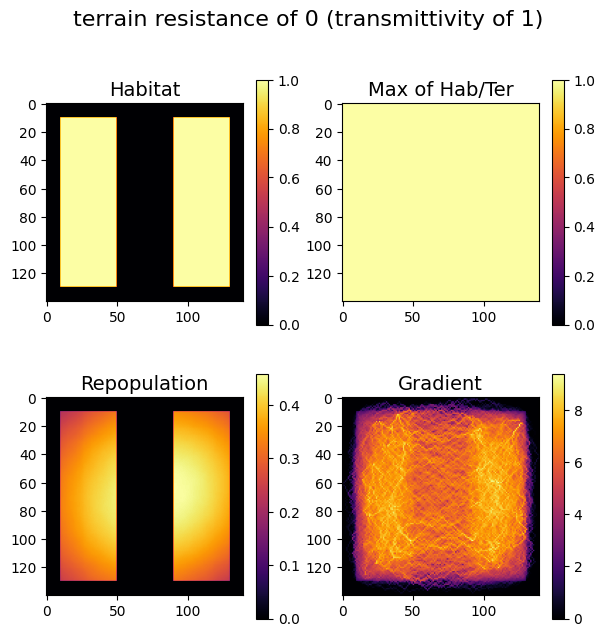

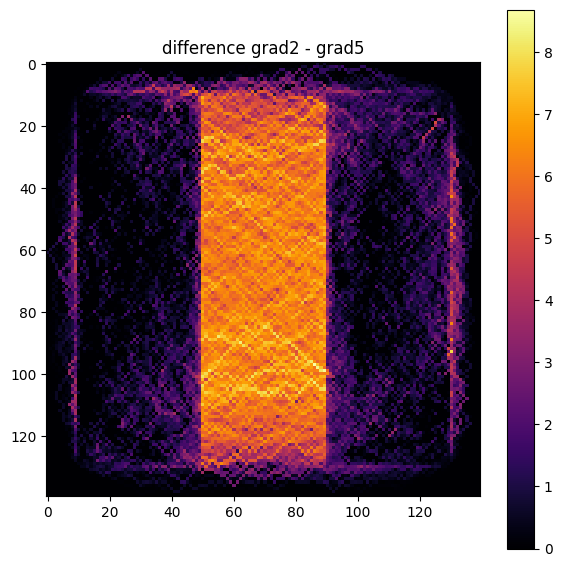

In [ ]:
ter = np.zeros((140, 140))
rep1, grad1 = simulate(ter=ter, title="terrain resistance of 1 (transmittivity of 0)")
print()

ter = np.full((140, 140), 0.8)
rep2, grad2 = simulate(ter=ter, title="terrain resistance of 0.2 (transmittivity of 0.8)")
print()

ter = np.full((140, 140), 0.9)
rep3, grad3 = simulate(ter=ter, title="terrain resistance of 0.1 (transmittivity of 0.9)")
print()

ter = np.full((140, 140), 0.95)
rep4, grad4 = simulate(ter=ter, title="terrain resistance of 0.05 (transmittivity of 0.95)")
print()

ter = np.full((140, 140), 1)
rep5, grad5 = simulate(ter=ter, title="terrain resistance of 0 (transmittivity of 1)")

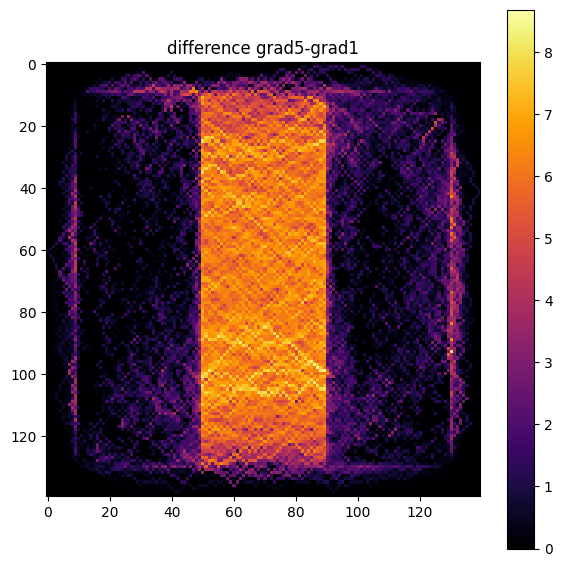

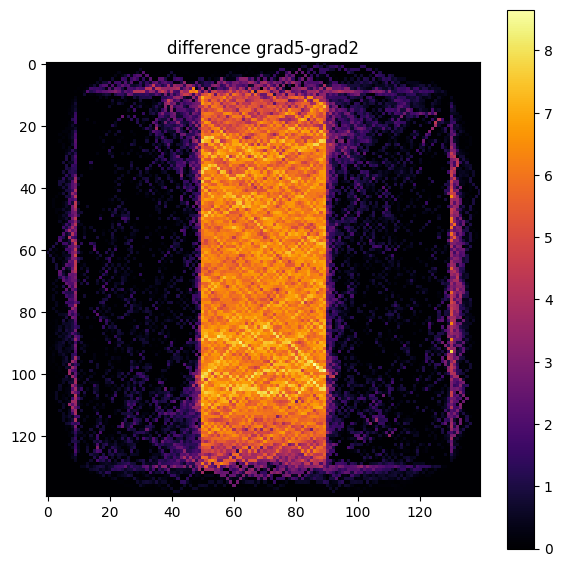

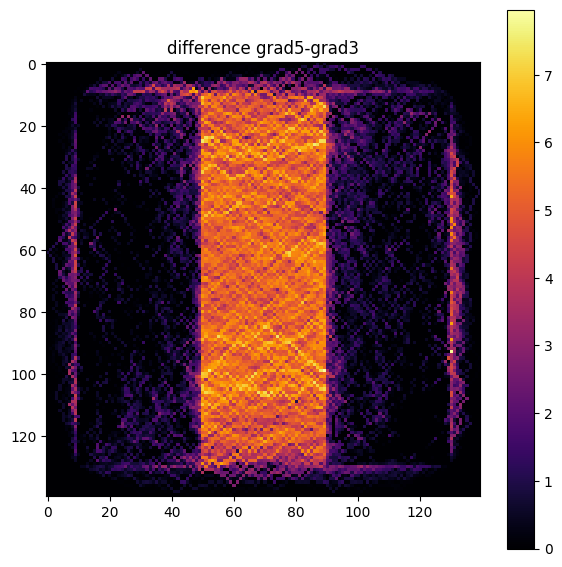

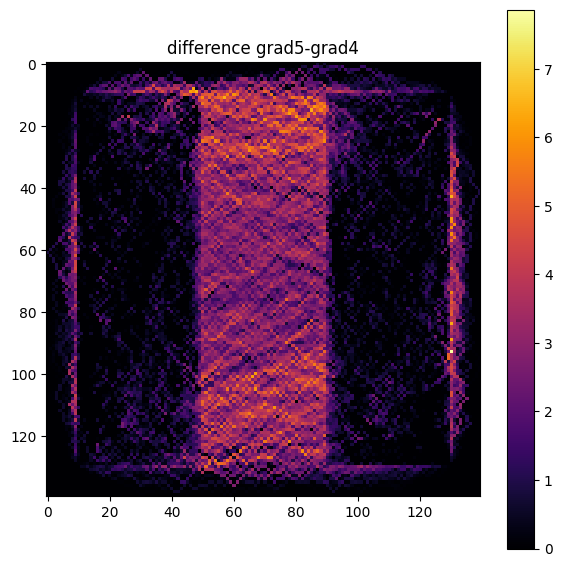

In [ ]:
grads = [grad1, grad2, grad3, grad4, grad5]

for i in range(0, len(grads)-1):
    diff = grad5 - grads[i]
    disp(diff, title=f"difference grad5-grad{i+1}")

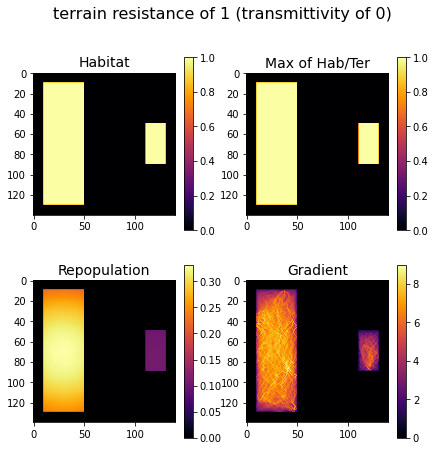

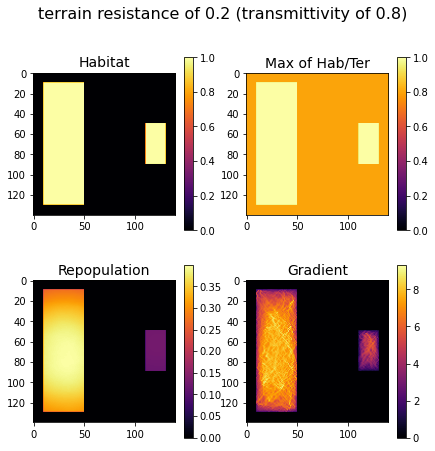

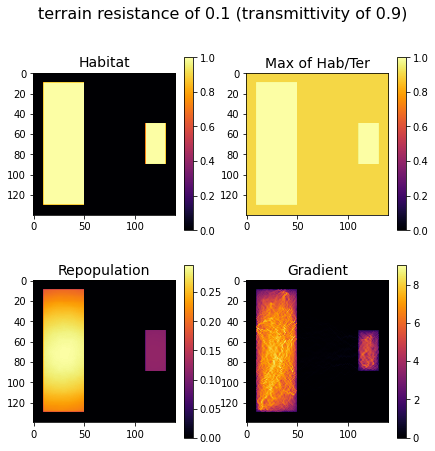

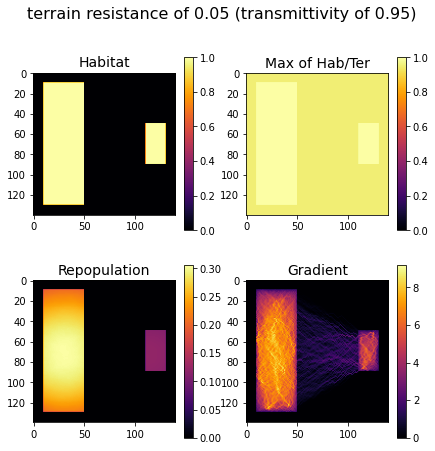

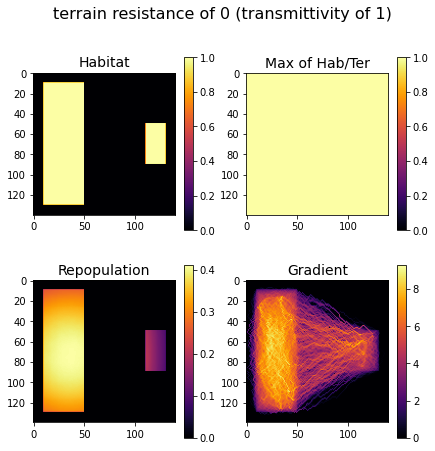

In [ ]:
ter = np.zeros((140, 140))
simulate(hab=hab_2, ter=ter, title="terrain resistance of 1 (transmittivity of 0)")
print()

ter = np.full((140, 140), 0.8)
simulate(hab=hab_2, ter=ter, title="terrain resistance of 0.2 (transmittivity of 0.8)")
print()

ter = np.full((140, 140), 0.9)
simulate(hab=hab_2,ter=ter, title="terrain resistance of 0.1 (transmittivity of 0.9)")
print()

ter = np.full((140, 140), 0.95)
simulate(hab=hab_2,ter=ter, title="terrain resistance of 0.05 (transmittivity of 0.95)")
print()

ter = np.full((140, 140), 1)
simulate(hab=hab_2, ter=ter, title="terrain resistance of 0 (transmittivity of 1)")

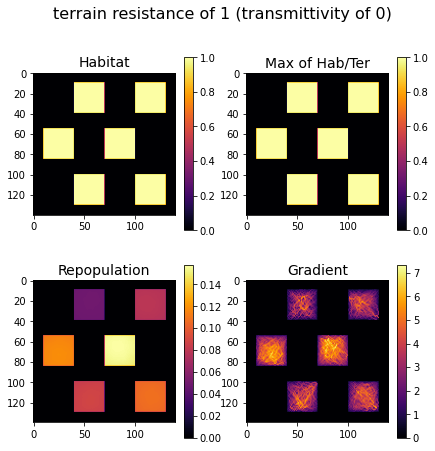

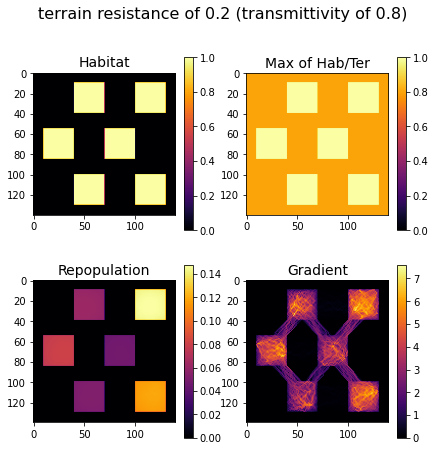

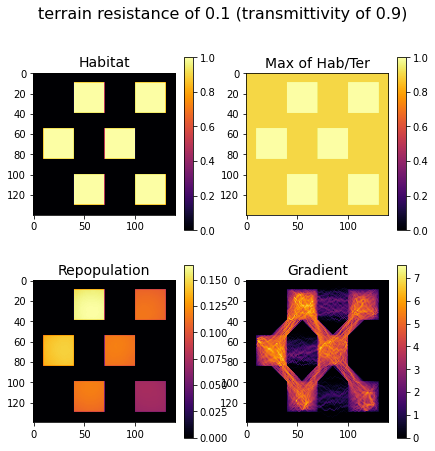

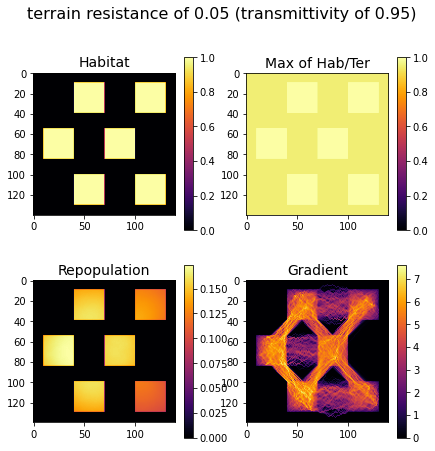

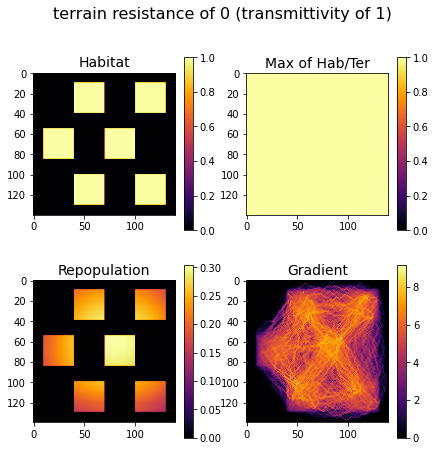

In [ ]:
ter = np.zeros((140, 140))
simulate(hab=hab_6, ter=ter, title="terrain resistance of 1 (transmittivity of 0)")
print()

ter = np.full((140, 140), 0.8)
simulate(hab=hab_6, ter=ter, title="terrain resistance of 0.2 (transmittivity of 0.8)")
print()

ter = np.full((140, 140), 0.9)
simulate(hab=hab_6,ter=ter, title="terrain resistance of 0.1 (transmittivity of 0.9)")
print()

ter = np.full((140, 140), 0.95)
simulate(hab=hab_6,ter=ter, title="terrain resistance of 0.05 (transmittivity of 0.95)")
print()

ter = np.full((140, 140), 1)
simulate(hab=hab_6, ter=ter, title="terrain resistance of 0 (transmittivity of 1)")

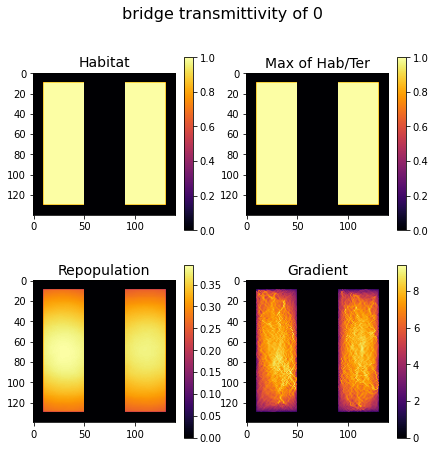

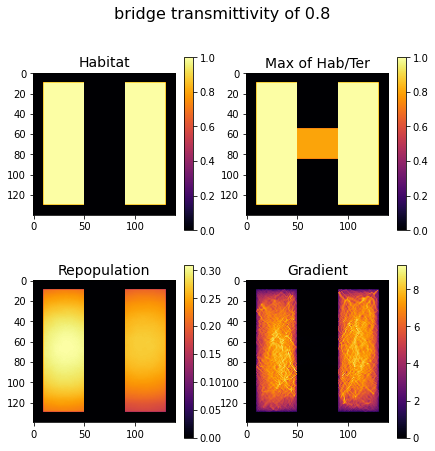

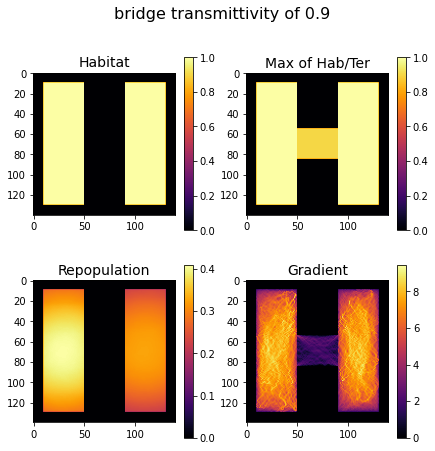

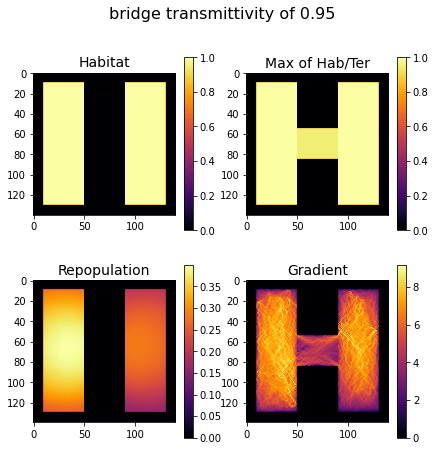

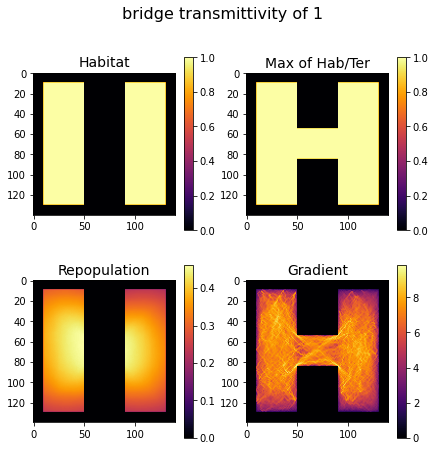

In [ ]:
ter = np.zeros((140, 140))
ter[55:85, 10:130] = 0
simulate(ter=ter, title="bridge transmittivity of 0")
print()

ter = np.zeros((140, 140))
ter[55:85, 10:130] = 0.8
simulate(ter=ter, title="bridge transmittivity of 0.8")
print()

ter = np.zeros((140, 140))
ter[55:85, 10:130] = 0.9
simulate(ter=ter, title="bridge transmittivity of 0.9")
print()

ter = np.zeros((140, 140))
ter[55:85, 10:130] = 0.95
simulate(ter=ter, title="bridge transmittivity of 0.95")
print()

ter = np.zeros((140, 140))
ter[55:85, 10:130] = 1
simulate(ter=ter, title="bridge transmittivity of 1")
print()

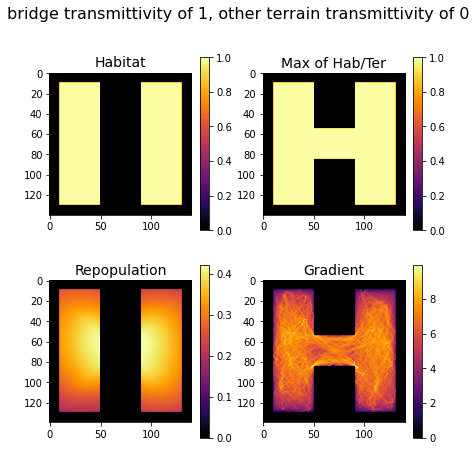

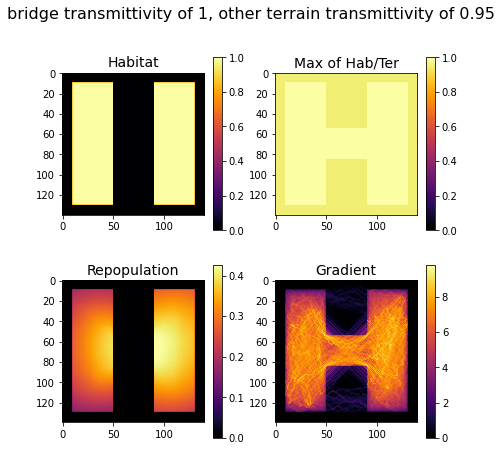

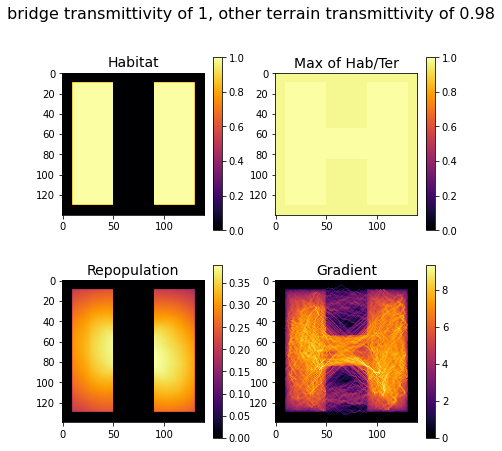

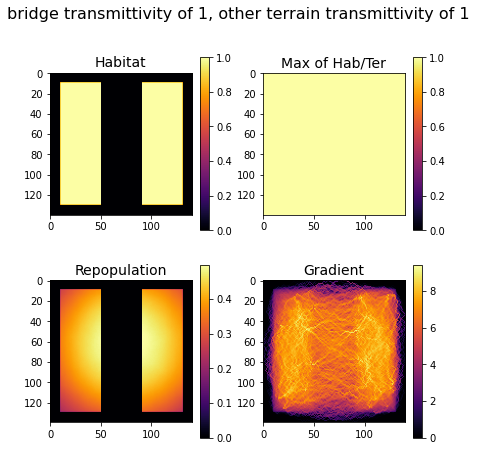

In [ ]:
ter = np.zeros((140, 140))
ter[55:85, 10:130] = 1
simulate(ter=ter, title="bridge transmittivity of 1, other terrain transmittivity of 0")
print()

ter = np.full((140, 140), 0.95)
ter[55:85, 10:130] = 1
simulate(ter=ter, title="bridge transmittivity of 1, other terrain transmittivity of 0.95")
print()

ter = np.full((140, 140), 0.98)
ter[55:85, 10:130] = 1
simulate(ter=ter, title="bridge transmittivity of 1, other terrain transmittivity of 0.98")
print()

ter = np.full((140, 140), 1)
ter[55:85, 10:130] = 1
simulate(ter=ter, title="bridge transmittivity of 1, other terrain transmittivity of 1")
print()

## 4. Hop distance

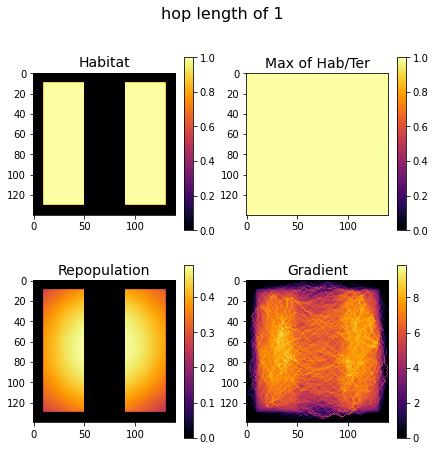

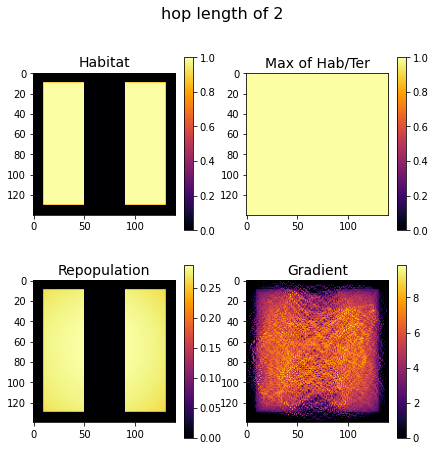

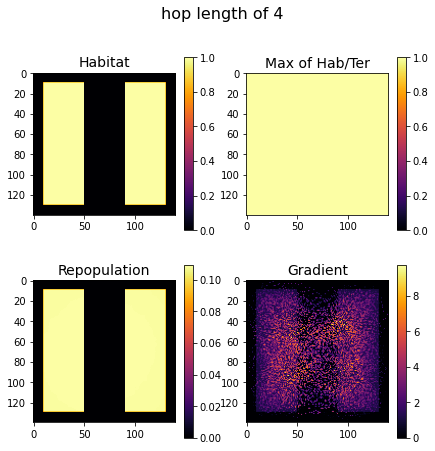

In [ ]:
simulate(hop_length=1, title="hop length of 1")
print()
simulate(hop_length=2, title="hop length of 2")
print()
simulate(hop_length=4, title="hop length of 4")

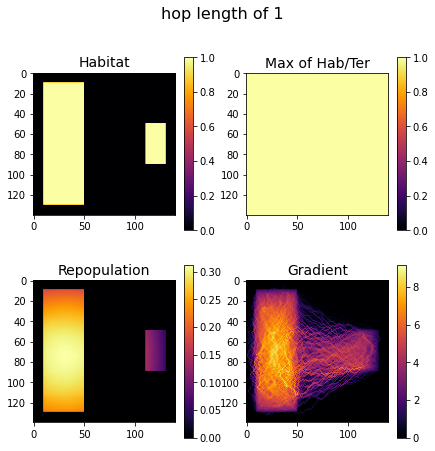

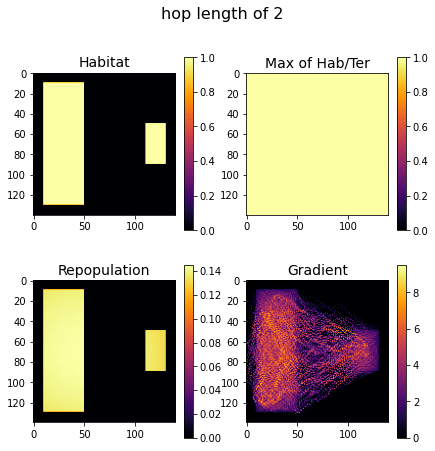

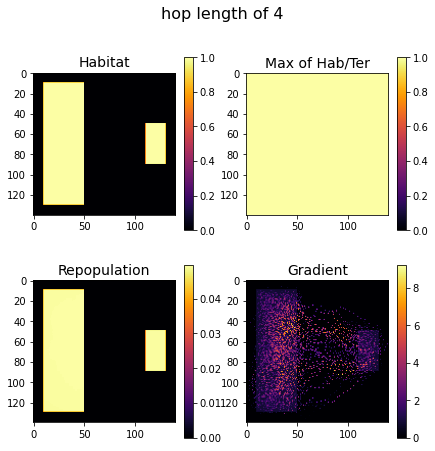

In [ ]:
simulate(hab=hab_2, hop_length=1, title="hop length of 1")
print()
simulate(hab=hab_2, hop_length=2, title="hop length of 2")
print()
simulate(hab=hab_2, hop_length=4, title="hop length of 4")

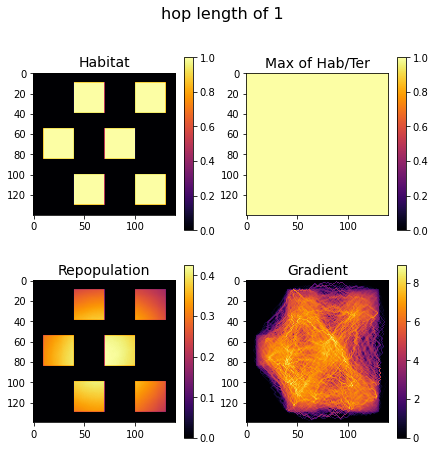

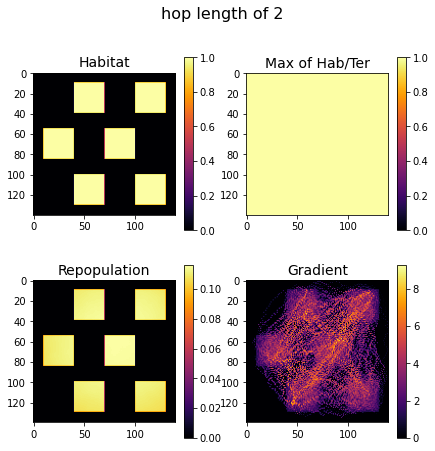

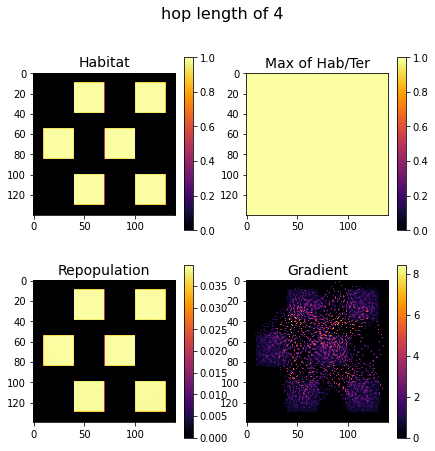

In [ ]:
simulate(hab=hab_6, hop_length=1, title="hop length of 1")
print()
simulate(hab=hab_6, hop_length=2, title="hop length of 2")
print()
simulate(hab=hab_6, hop_length=4, title="hop length of 4")

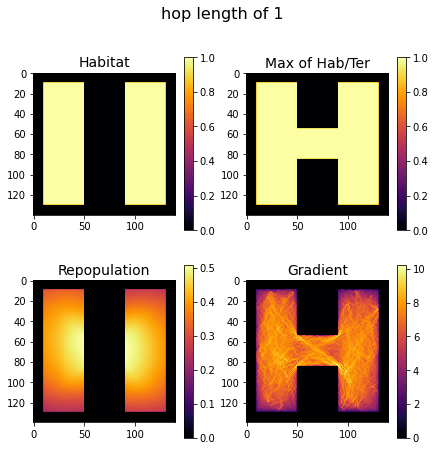

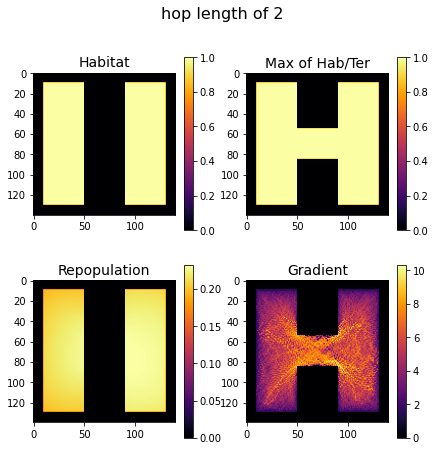

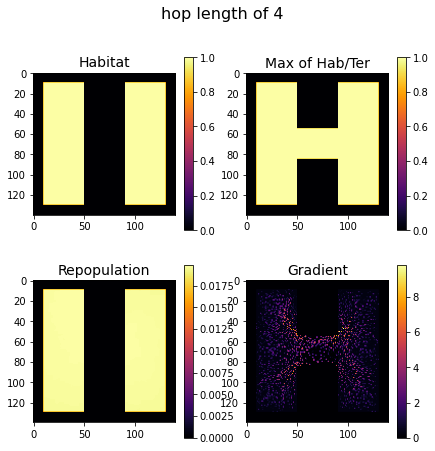

In [ ]:
simulate(ter=ter_2, hop_length=1, title="hop length of 1")
print()
simulate(ter=ter_2, hop_length=2, title="hop length of 2")
print()
simulate(ter=ter_2, hop_length=4, title="hop length of 4")

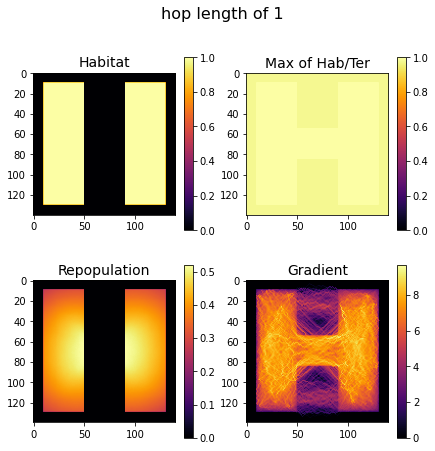

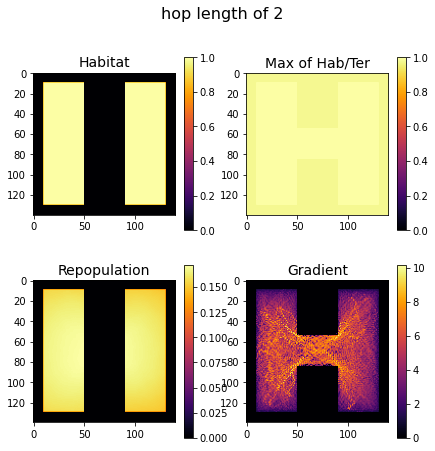

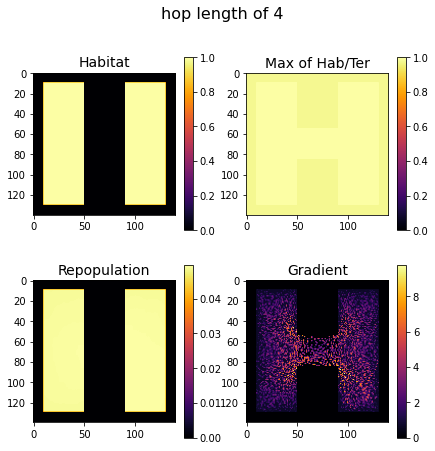

In [ ]:
simulate(ter=ter_5, hop_length=1, title="hop length of 1")
print()
simulate(ter=ter_5, hop_length=2, title="hop length of 2")
print()
simulate(ter=ter_5, hop_length=4, title="hop length of 4")

## 5. Patch distance

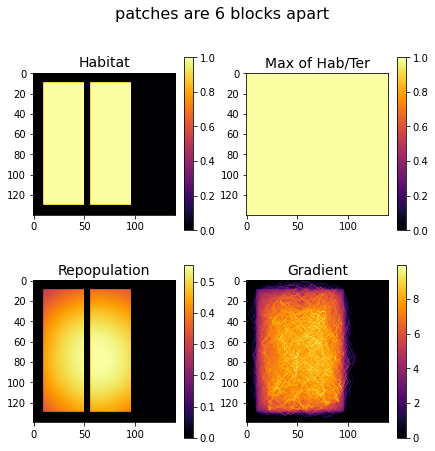

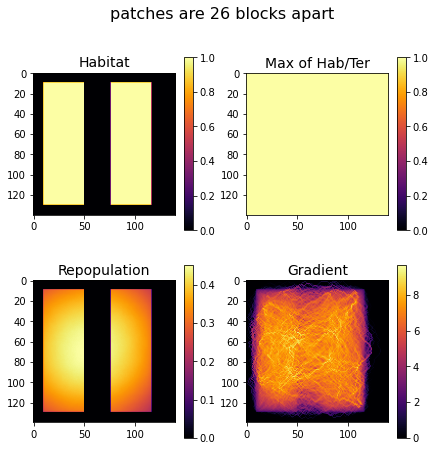

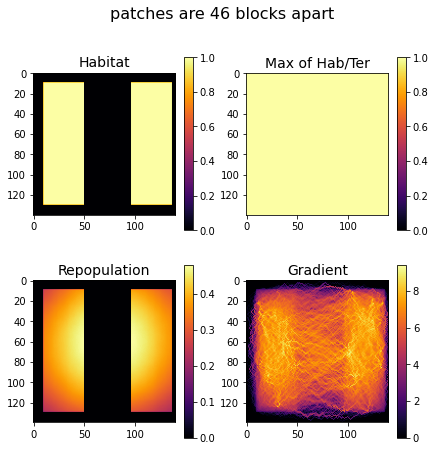

In [ ]:
hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:130, 56:96] = 1
simulate(hab=hab, title="patches are 6 blocks apart")
print()

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:130, 76:116] = 1
simulate(hab=hab, title="patches are 26 blocks apart")
print()

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[10:130, 96:136] = 1
simulate(hab=hab, title="patches are 46 blocks apart")

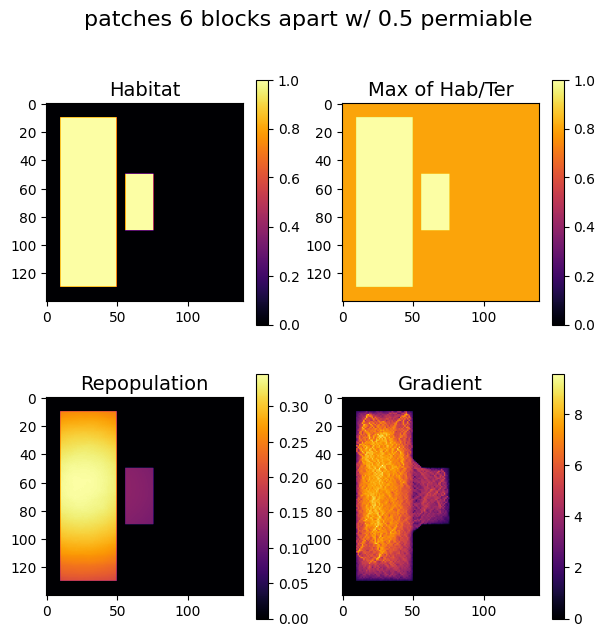

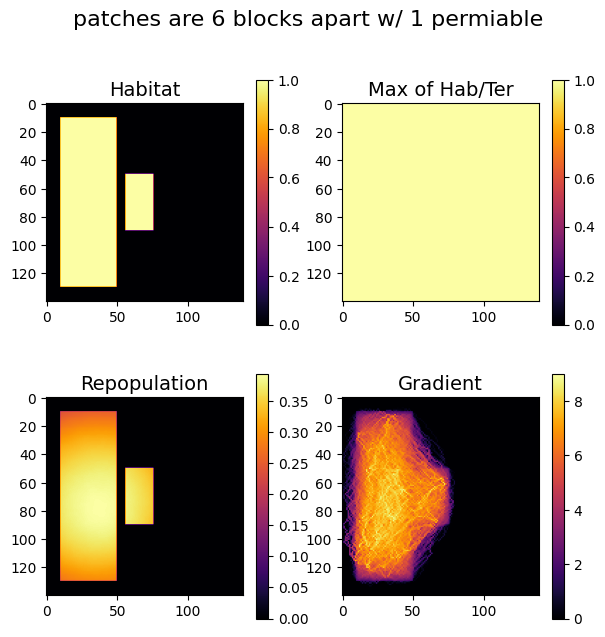

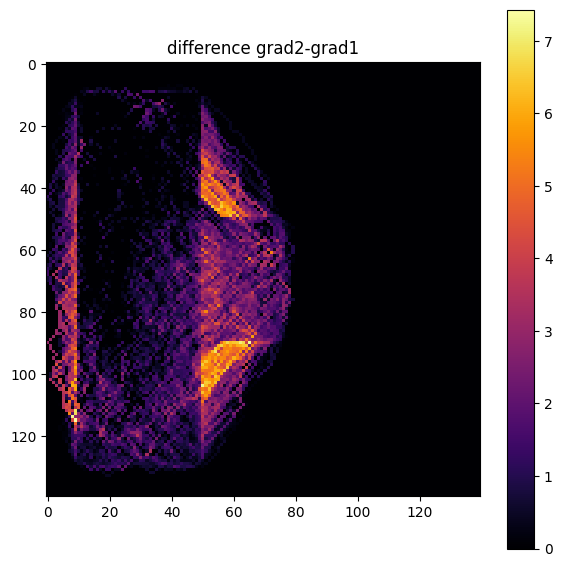

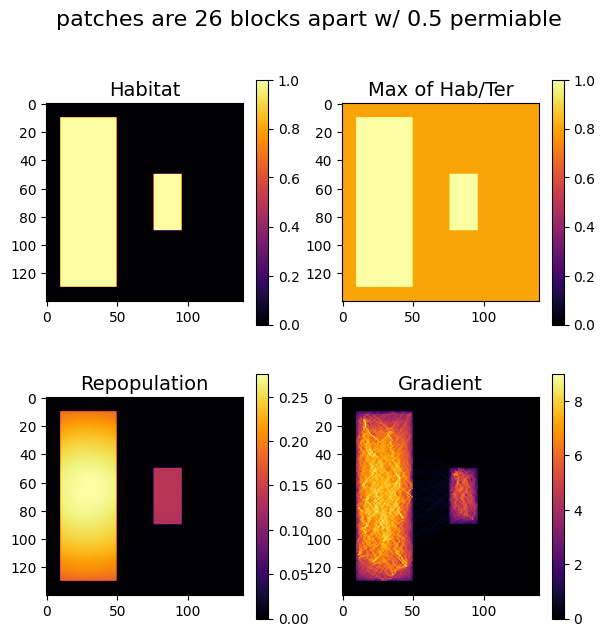

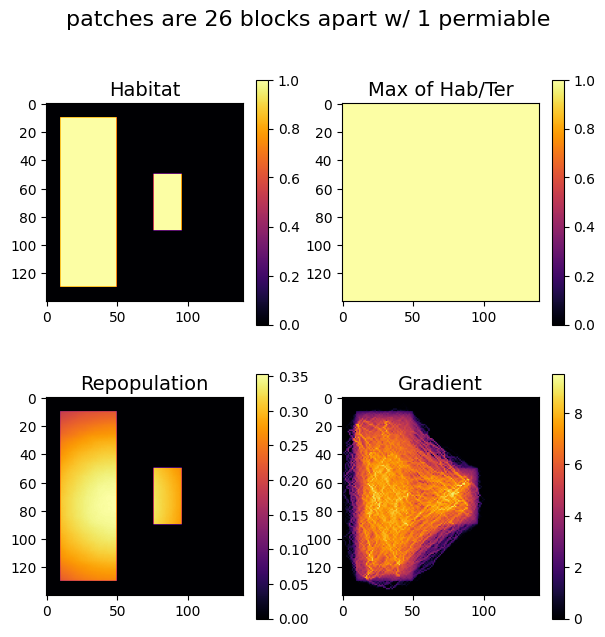

...

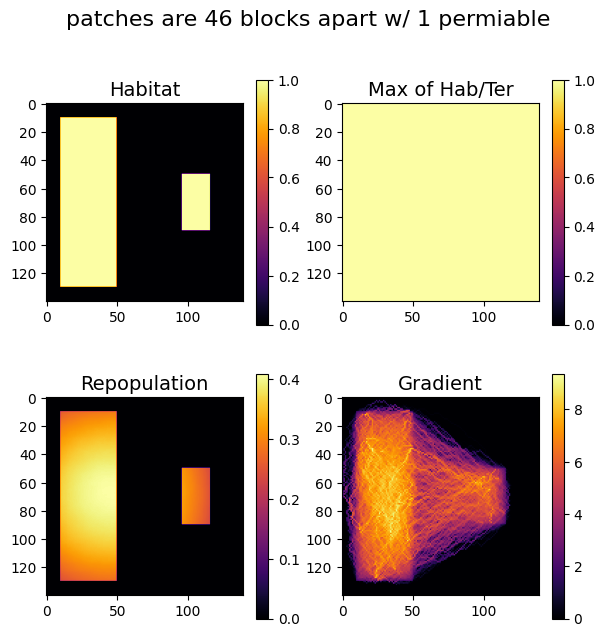

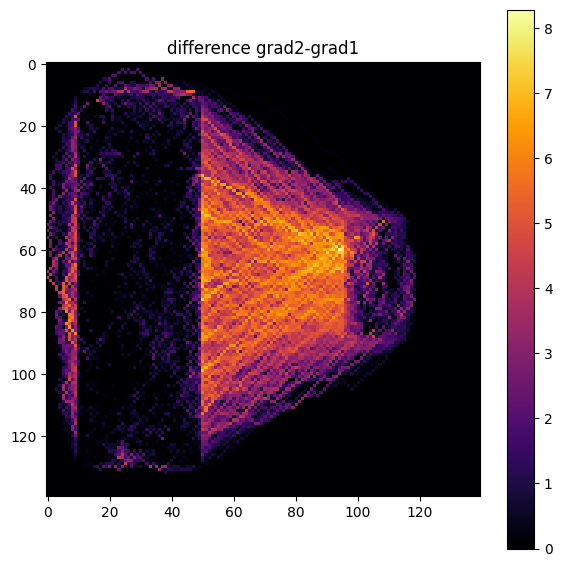

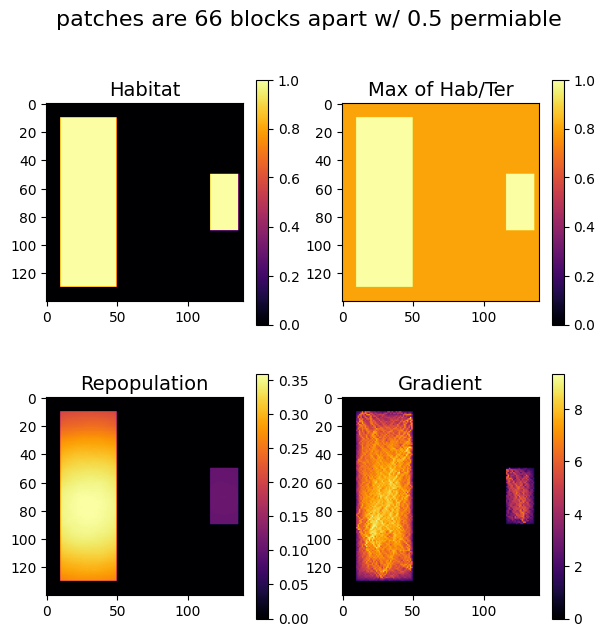

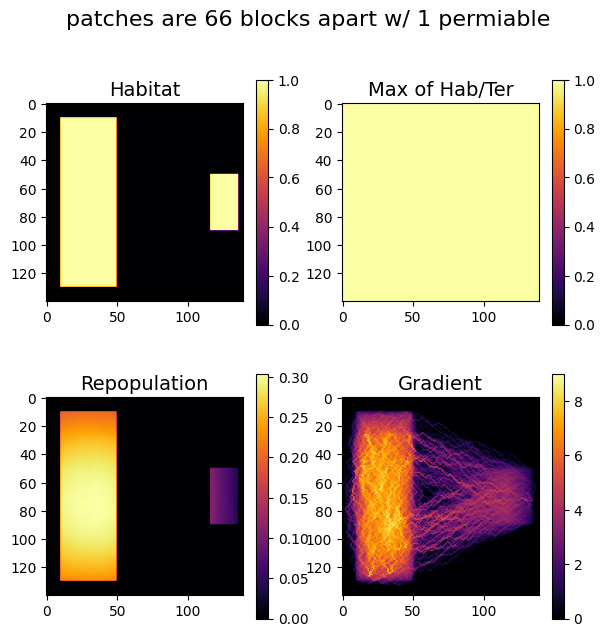

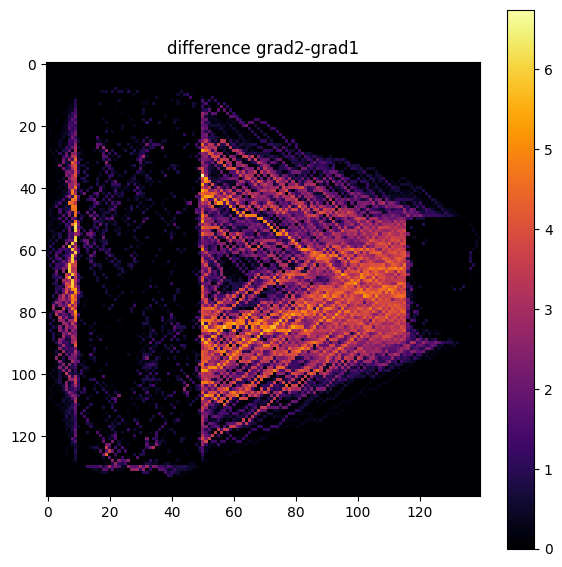

In [ ]:
hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[50:90, 56:76] = 1

repop1, grad1 = simulate(hab=hab, ter=ter_10, title="patches 6 blocks apart w/ 0.5 permiable")
print()
repop2, grad2 = simulate(hab=hab, ter=ter_1, title="patches are 6 blocks apart w/ 1 permiable")
print()
diff1 = grad2 - grad1
disp(diff1, title=f"difference grad2-grad1")

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[50:90, 76:96] = 1
repop1, grad1 = simulate(hab=hab, ter=ter_10, title="patches are 26 blocks apart w/ 0.5 permiable")
print()
repop2, grad2 = simulate(hab=hab, ter=ter_1, title="patches are 26 blocks apart w/ 1 permiable")
print()
diff2 = grad2 - grad1
disp(diff2, title=f"difference grad2-grad1")

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[50:90, 96:116] = 1
repop1, grad1 = simulate(hab=hab, ter=ter_10, title="patches are 46 blocks apart w/ 0.5 permiable")
print()
repop2, grad2 = simulate(hab=hab, ter=ter_1, title="patches are 46 blocks apart w/ 1 permiable")
print()
diff2 = grad2 - grad1
disp(diff2, title=f"difference grad2-grad1")

hab = np.zeros((140, 140))
hab[10:130, 10:50] = 1
hab[50:90, 116:136] = 1
repop1, grad1 = simulate(hab=hab, ter=ter_10, title="patches are 66 blocks apart w/ 0.5 permiable")
print()
repop2, grad2 = simulate(hab=hab, ter=ter_1, title="patches are 66 blocks apart w/ 1 permiable")
print()
diff2 = grad2 - grad1
disp(diff2, title=f"difference grad2-grad1")

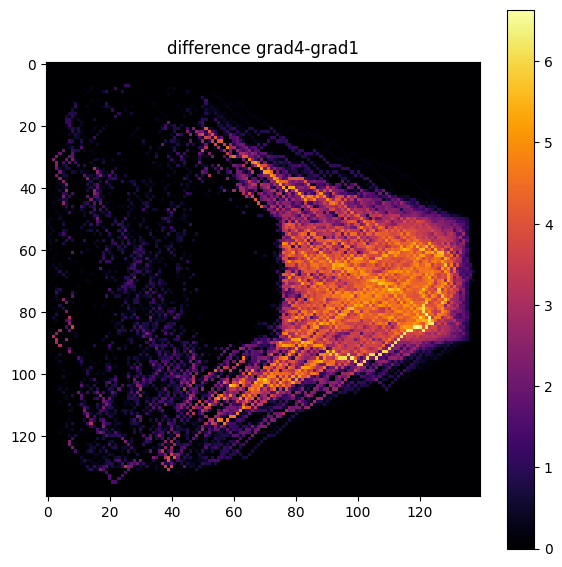

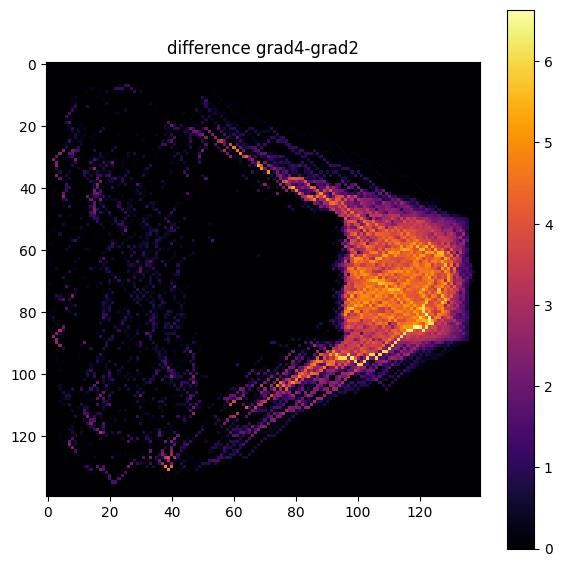

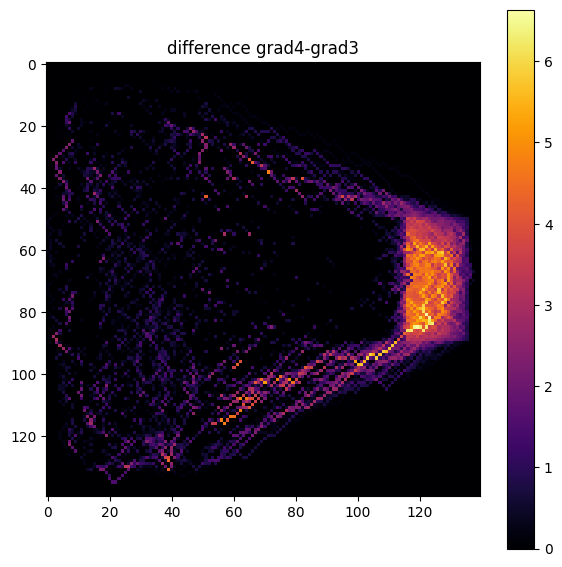

In [ ]:
grads = [grad1, grad2, grad3, grad4]

for i in range(0, len(grads)-1):
    diff = grads[-1] - grads[i]
    disp(diff, title=f"difference grad{len(grads)}-grad{i+1}")

## 6. Seed density

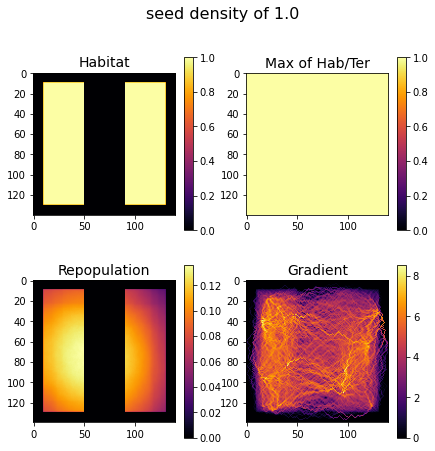

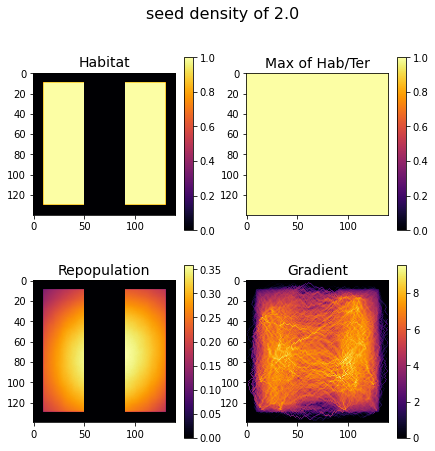

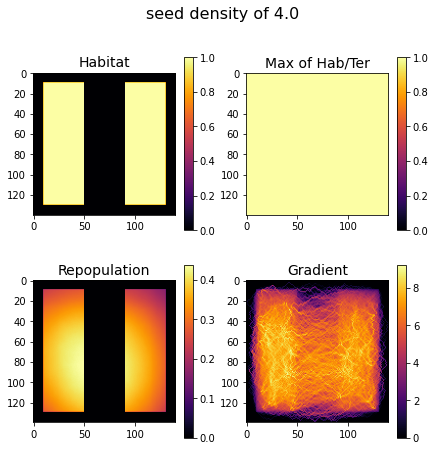

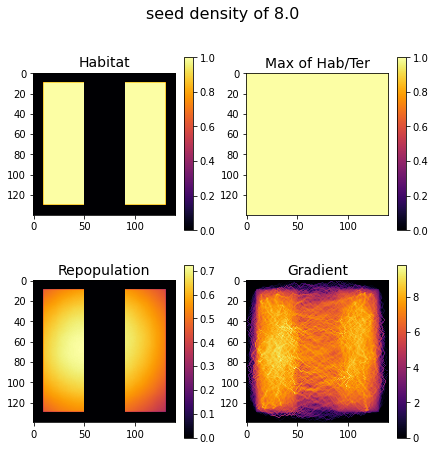

In [ ]:
simulate(seed_density=1.0, title="seed density of 1.0")
print()
simulate(seed_density=2.0, title="seed density of 2.0")
print()
simulate(seed_density=4.0, title="seed density of 4.0")
print()
simulate(seed_density=8.0, title="seed density of 8.0")

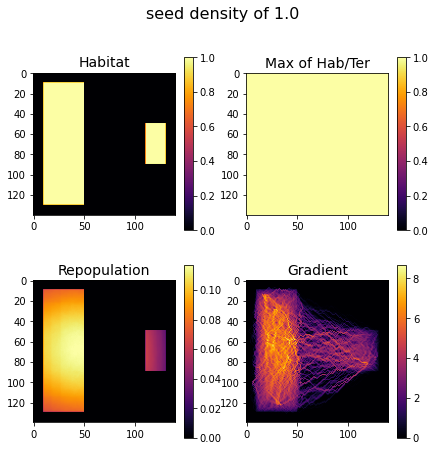

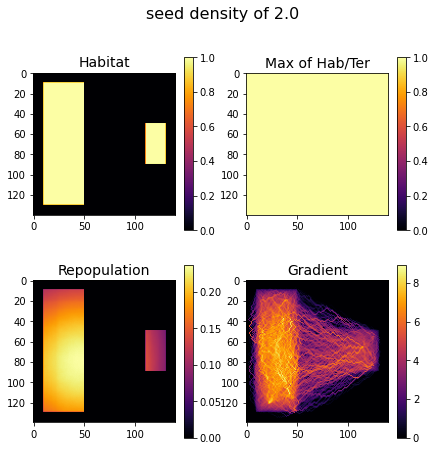

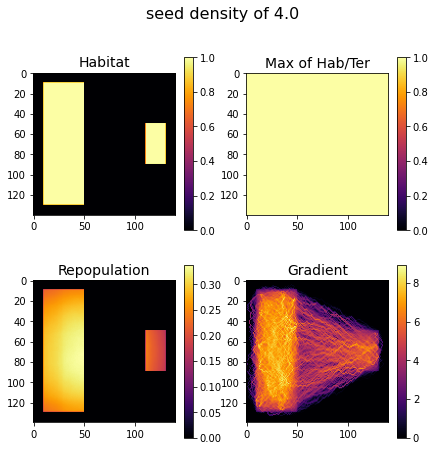

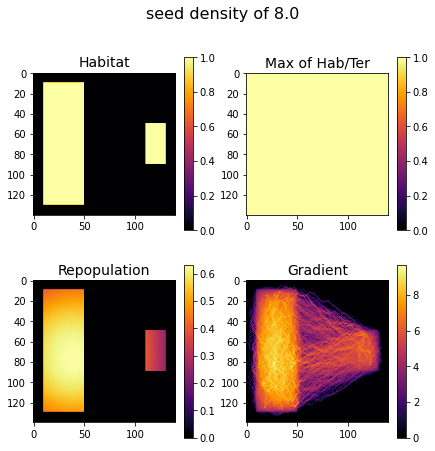

In [ ]:
simulate(hab=hab_2, seed_density=1.0, title="seed density of 1.0")
print()
simulate(hab=hab_2, seed_density=2.0, title="seed density of 2.0")
print()
simulate(hab=hab_2, seed_density=4.0, title="seed density of 4.0")
print()
simulate(hab=hab_2, seed_density=8.0, title="seed density of 8.0")

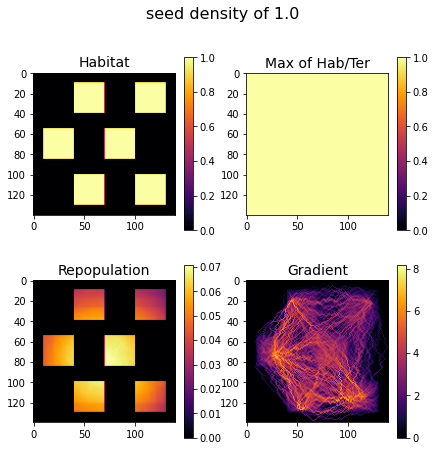

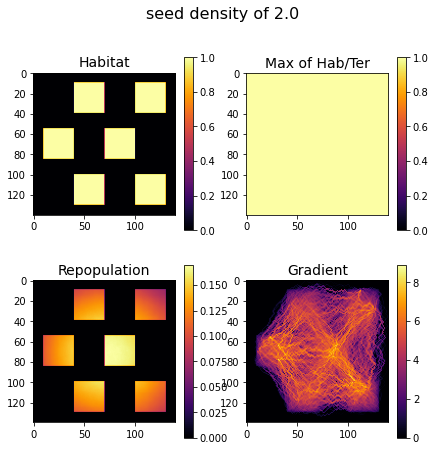

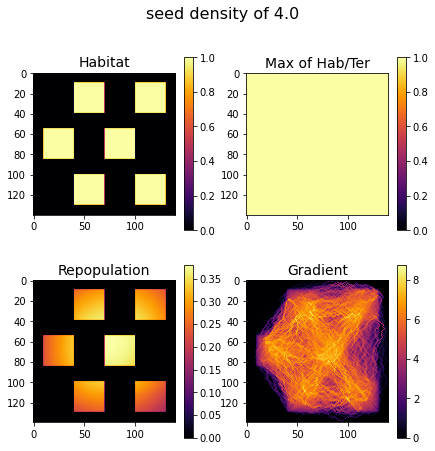

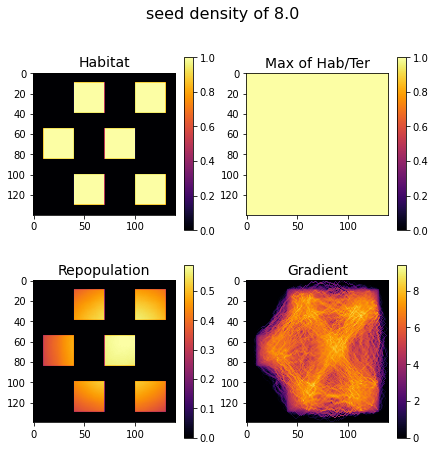

In [ ]:
simulate(hab=hab_6, seed_density=1.0, title="seed density of 1.0")
print()
simulate(hab=hab_6, seed_density=2.0, title="seed density of 2.0")
print()
simulate(hab=hab_6, seed_density=4.0, title="seed density of 4.0")
print()
simulate(hab=hab_6, seed_density=8.0, title="seed density of 8.0")

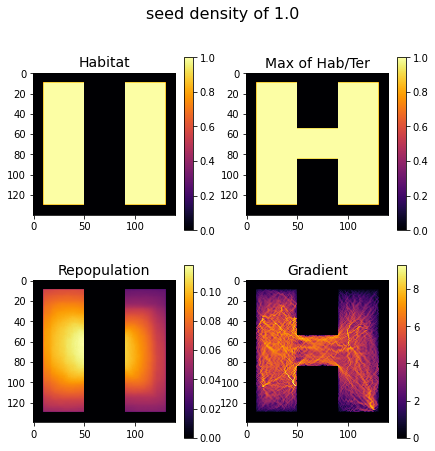

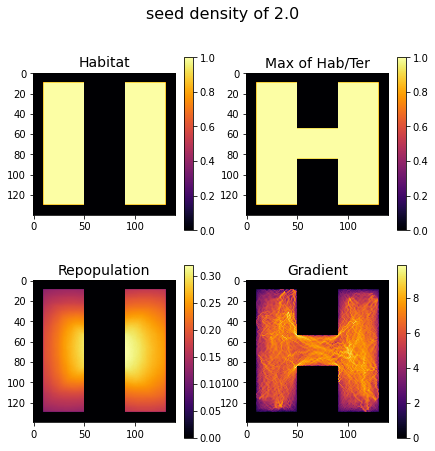

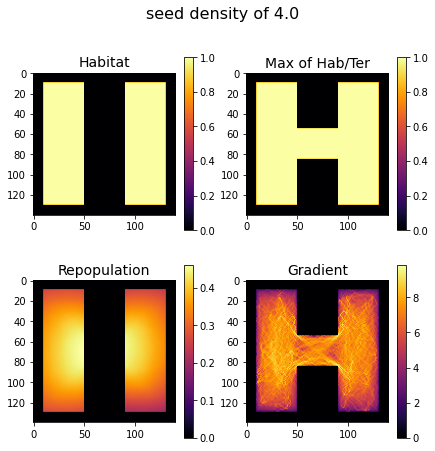

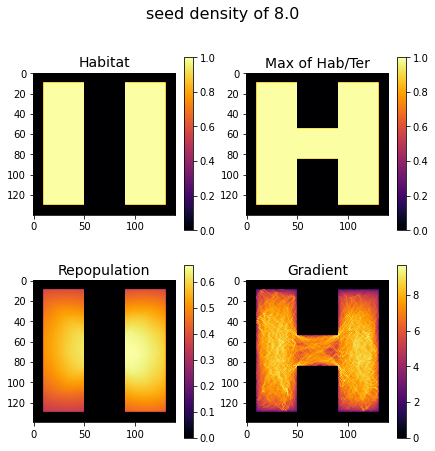

In [ ]:
simulate(ter=ter_2, seed_density=1.0, title="seed density of 1.0")
print()
simulate(ter=ter_2, seed_density=2.0, title="seed density of 2.0")
print()
simulate(ter=ter_2, seed_density=4.0, title="seed density of 4.0")
print()
simulate(ter=ter_2, seed_density=8.0, title="seed density of 8.0")

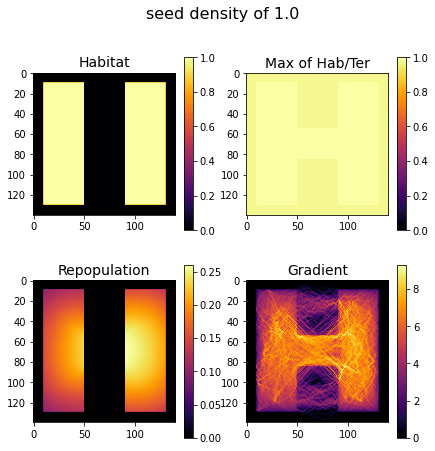

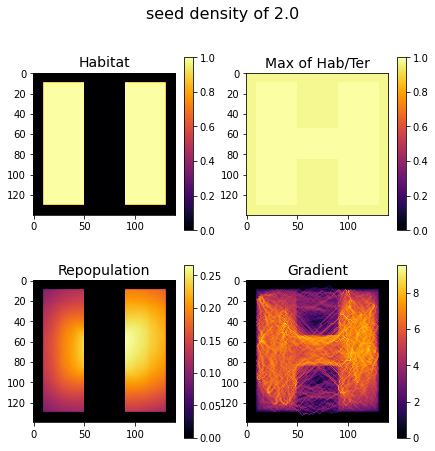

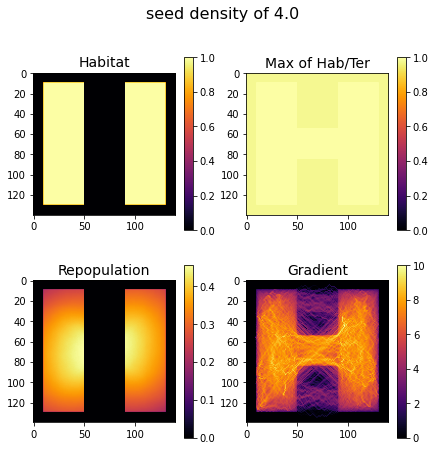

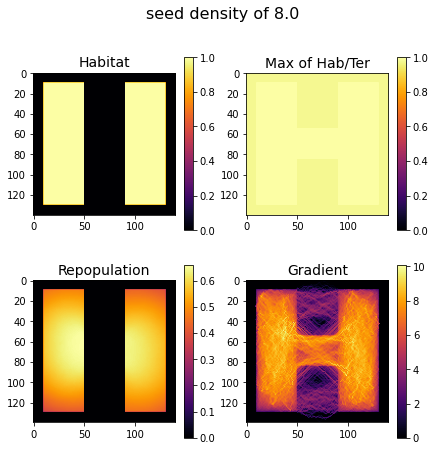

In [ ]:
simulate(ter=ter_5, seed_density=1.0, title="seed density of 1.0")
print()
simulate(ter=ter_5, seed_density=2.0, title="seed density of 2.0")
print()
simulate(ter=ter_5, seed_density=4.0, title="seed density of 4.0")
print()
simulate(ter=ter_5, seed_density=8.0, title="seed density of 8.0")

## 7. Number of spreads

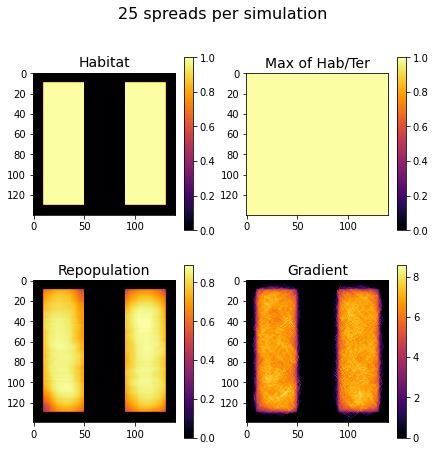

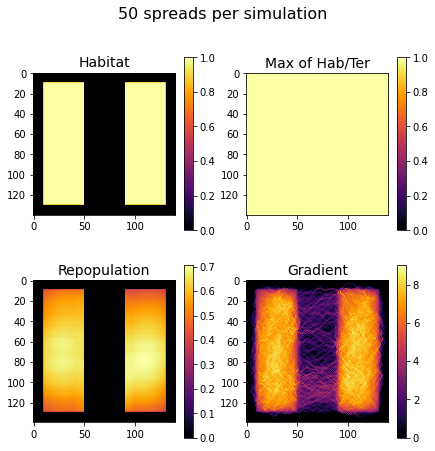

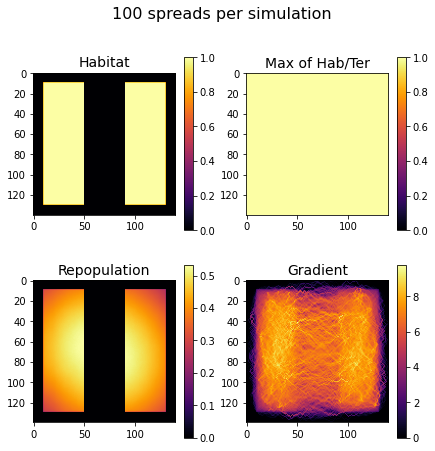

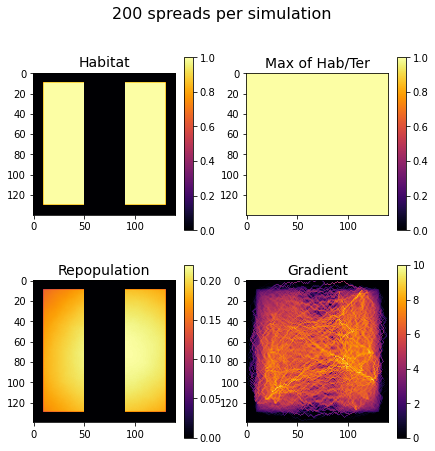

In [ ]:
simulate(total_spreads=25, title="25 spreads per simulation")
print()
simulate(total_spreads=50, title="50 spreads per simulation")
print()
simulate(total_spreads=100, title="100 spreads per simulation")
print()
simulate(total_spreads=200, title="200 spreads per simulation")

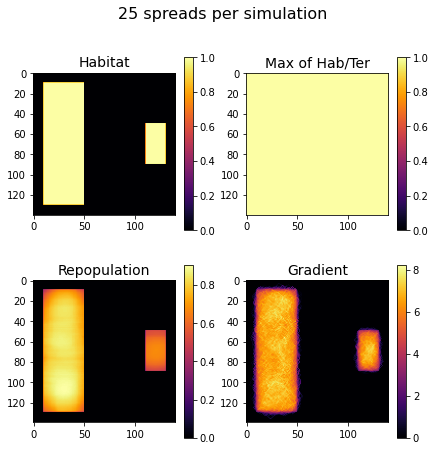

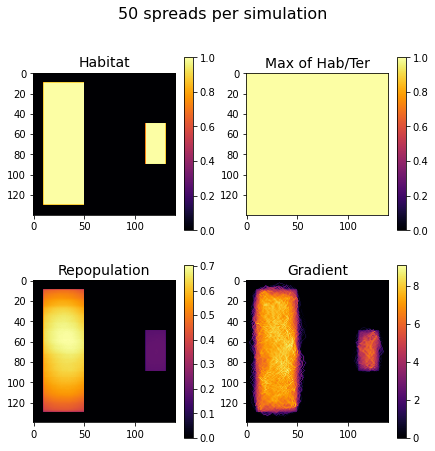

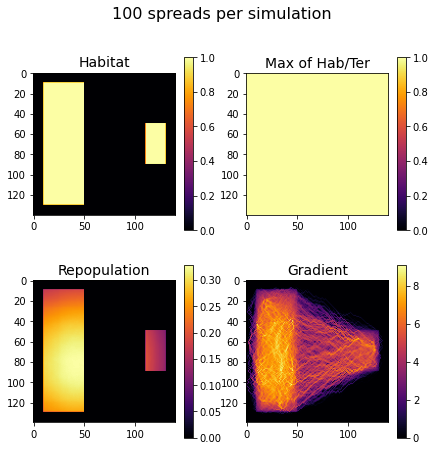

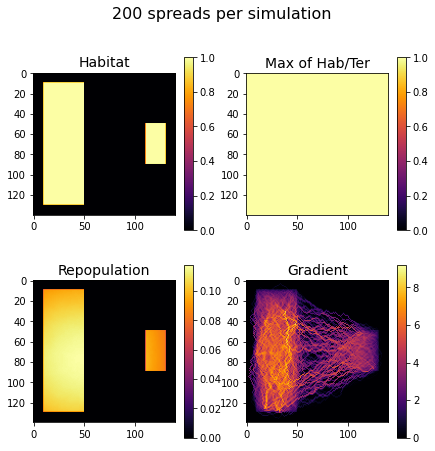

In [ ]:
simulate(hab=hab_2, total_spreads=25, title="25 spreads per simulation")
print()
simulate(hab=hab_2, total_spreads=50, title="50 spreads per simulation")
print()
simulate(hab=hab_2, total_spreads=100, title="100 spreads per simulation")
print()
simulate(hab=hab_2, total_spreads=200, title="200 spreads per simulation")

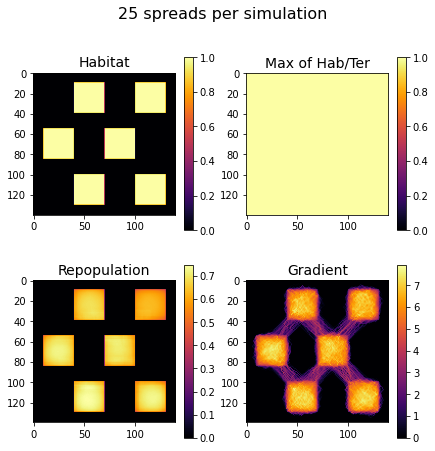

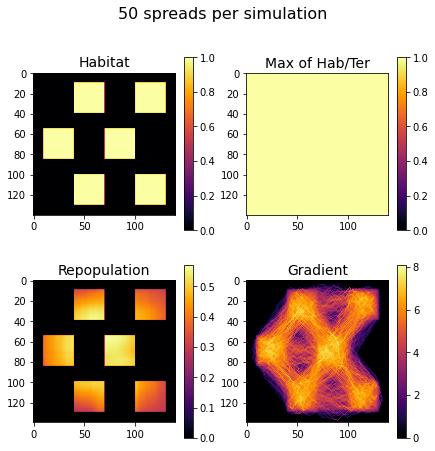

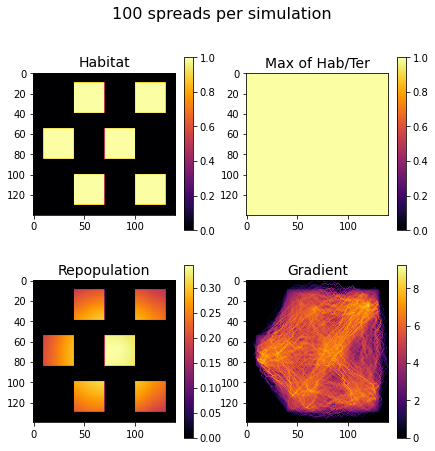

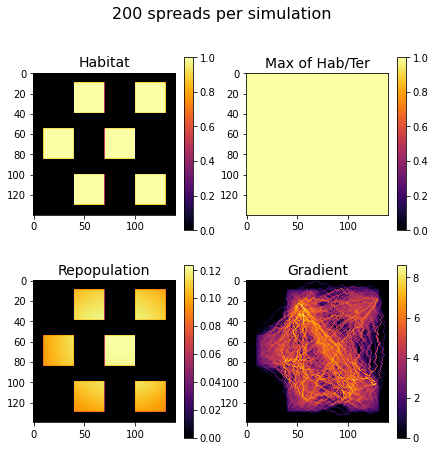

In [ ]:
simulate(hab=hab_6, total_spreads=25, title="25 spreads per simulation")
print()
simulate(hab=hab_6, total_spreads=50, title="50 spreads per simulation")
print()
simulate(hab=hab_6, total_spreads=100, title="100 spreads per simulation")
print()
simulate(hab=hab_6, total_spreads=200, title="200 spreads per simulation")

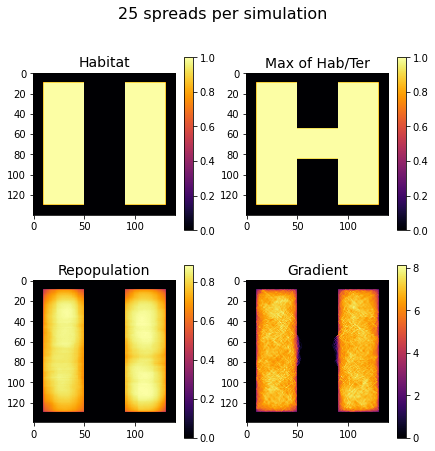

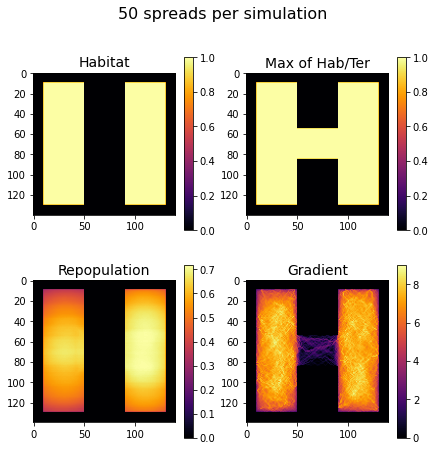

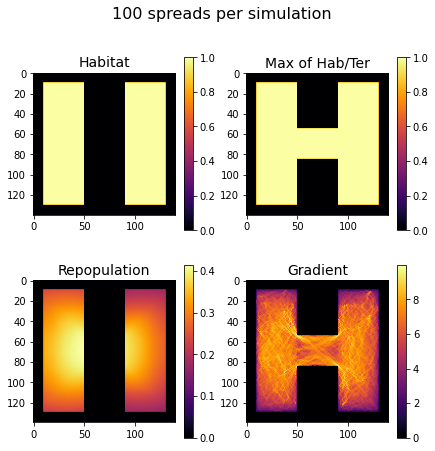

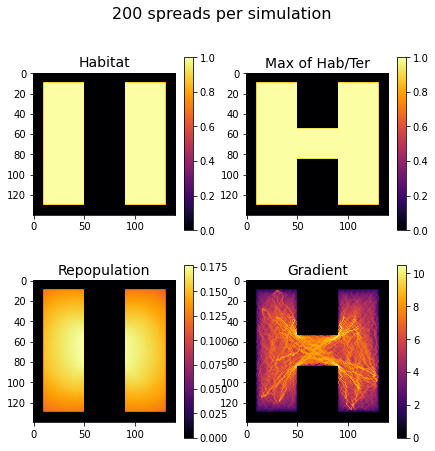

In [ ]:
simulate(ter=ter_2, total_spreads=25, title="25 spreads per simulation")
print()
simulate(ter=ter_2, total_spreads=50, title="50 spreads per simulation")
print()
simulate(ter=ter_2, total_spreads=100, title="100 spreads per simulation")
print()
simulate(ter=ter_2, total_spreads=200, title="200 spreads per simulation")

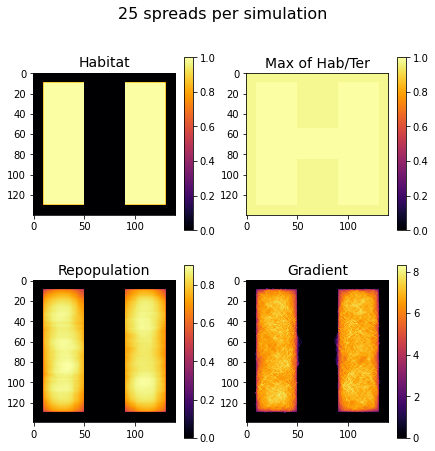

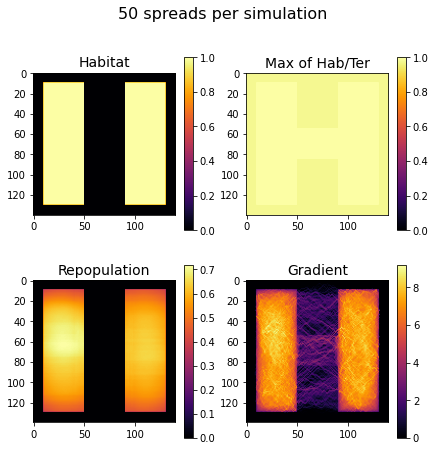

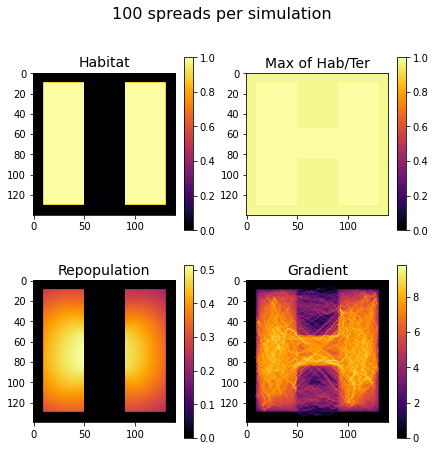

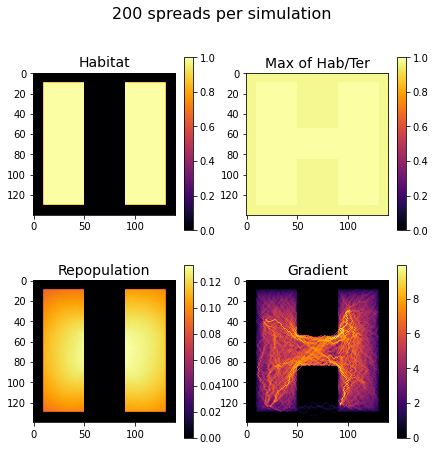

In [ ]:
simulate(ter=ter_5, total_spreads=25, title="25 spreads per simulation")
print()
simulate(ter=ter_5, total_spreads=50, title="50 spreads per simulation")
print()
simulate(ter=ter_5, total_spreads=100, title="100 spreads per simulation")
print()
simulate(ter=ter_5, total_spreads=200, title="200 spreads per simulation")

## 8. Batch size

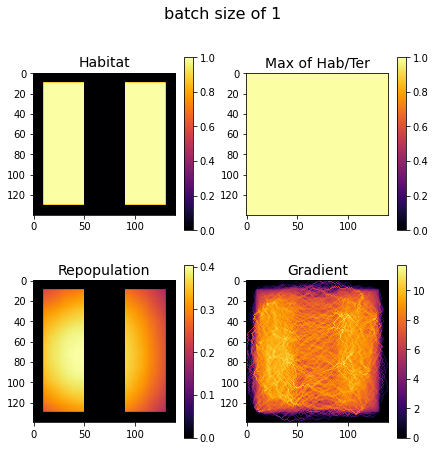

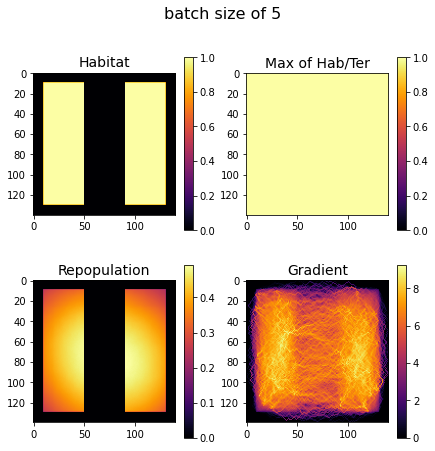

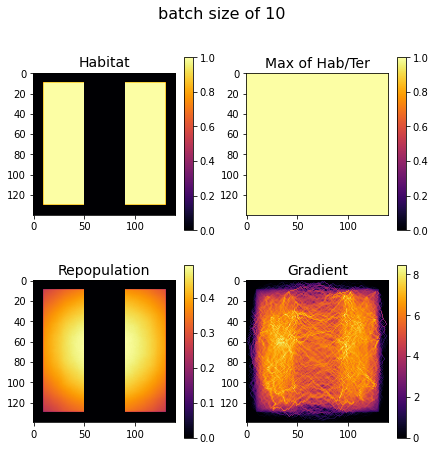

In [ ]:
simulate(batch_size=1, title="batch size of 1")
print()
simulate(batch_size=5, title="batch size of 5")
print()
simulate(batch_size=10, title="batch size of 10")

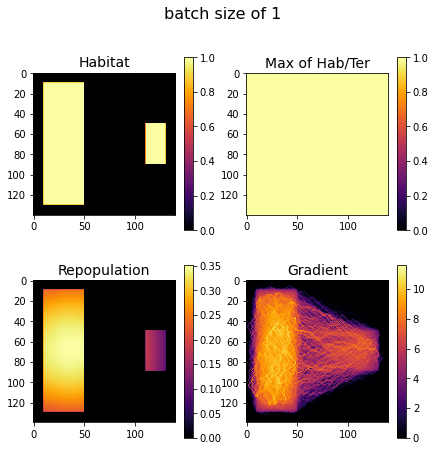

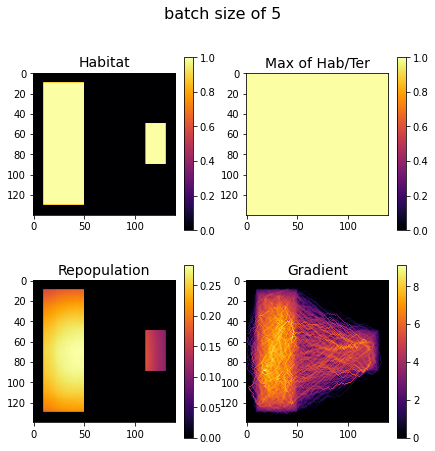

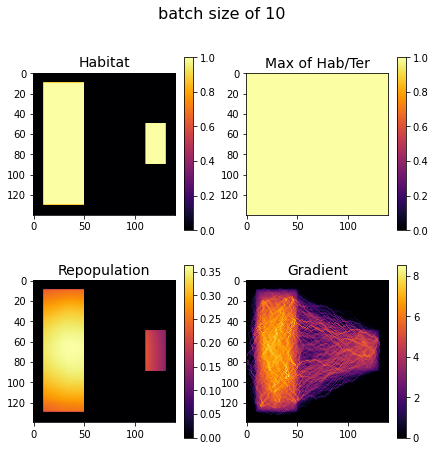

In [ ]:
simulate(hab=hab_2, batch_size=1, title="batch size of 1")
print()
simulate(hab=hab_2, batch_size=5, title="batch size of 5")
print()
simulate(hab=hab_2, batch_size=10, title="batch size of 10")

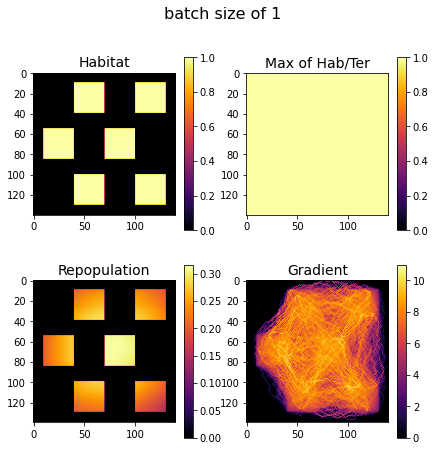

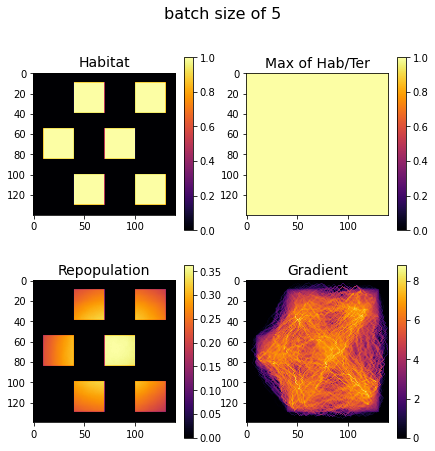

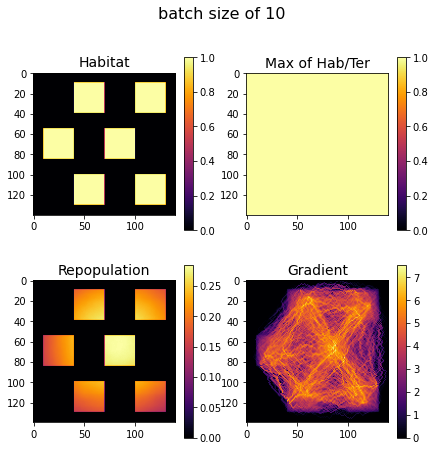

In [ ]:
simulate(hab=hab_6, batch_size=1, title="batch size of 1")
print()
simulate(hab=hab_6, batch_size=5, title="batch size of 5")
print()
simulate(hab=hab_6, batch_size=10, title="batch size of 10")

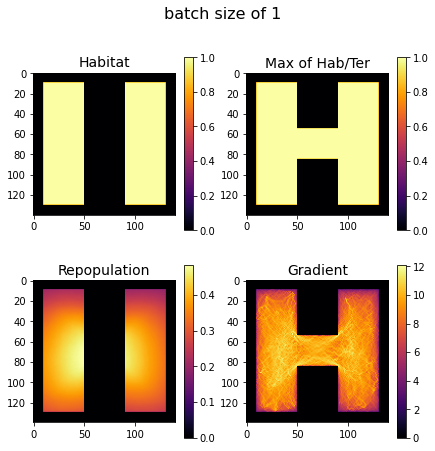

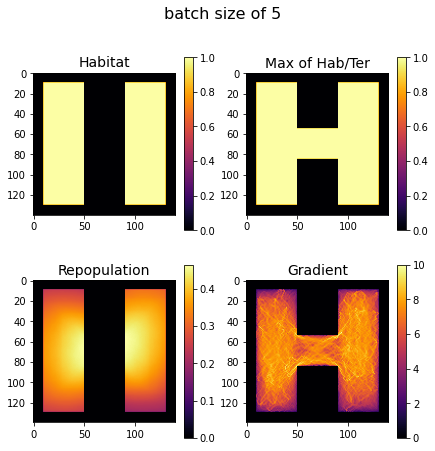

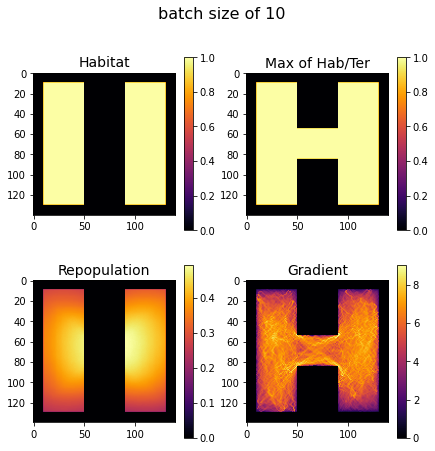

In [ ]:
simulate(ter=ter_2, batch_size=1, title="batch size of 1")
print()
simulate(ter=ter_2, batch_size=5, title="batch size of 5")
print()
simulate(ter=ter_2, batch_size=10, title="batch size of 10")

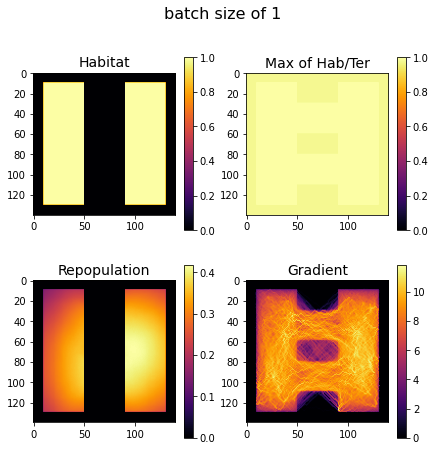

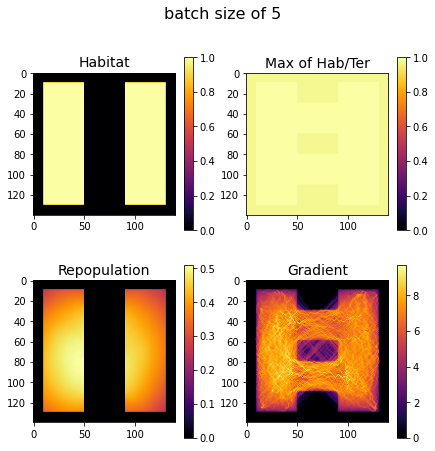

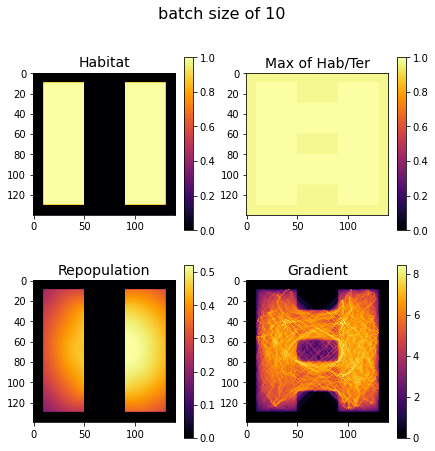

In [ ]:
simulate(ter=ter_6, batch_size=1, title="batch size of 1")
print()
simulate(ter=ter_6, batch_size=5, title="batch size of 5")
print()
simulate(ter=ter_6, batch_size=10, title="batch size of 10")

## 9. Number of simulations

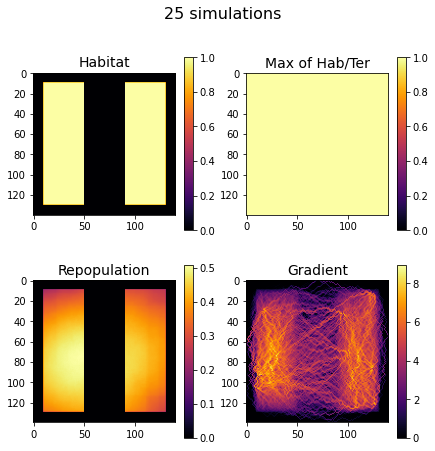

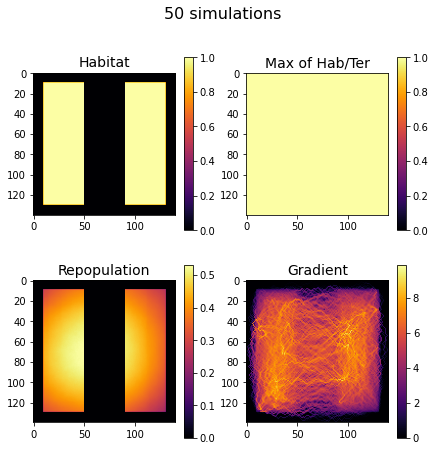

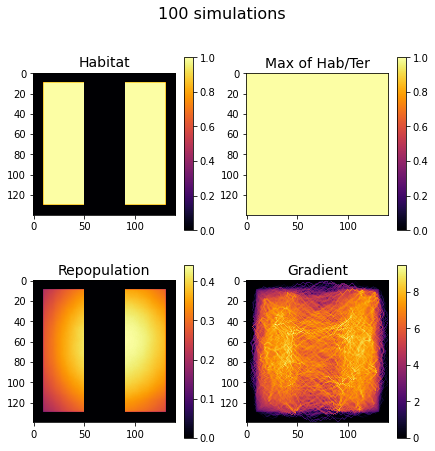

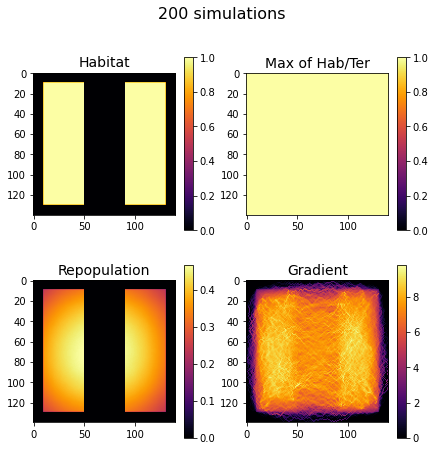

In [ ]:
simulate(num_simulations=25, title="25 simulations")
print()
simulate(num_simulations=50, title="50 simulations")
print()
simulate(num_simulations=100, title="100 simulations")
print()
simulate(num_simulations=200, title="200 simulations")

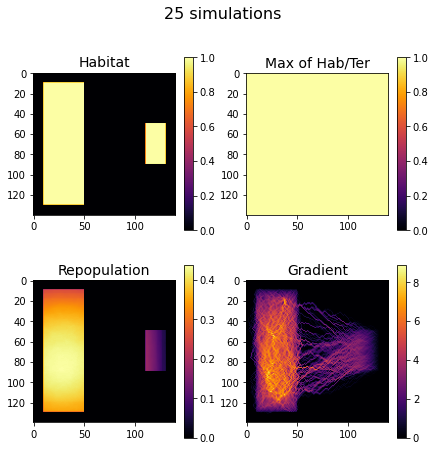

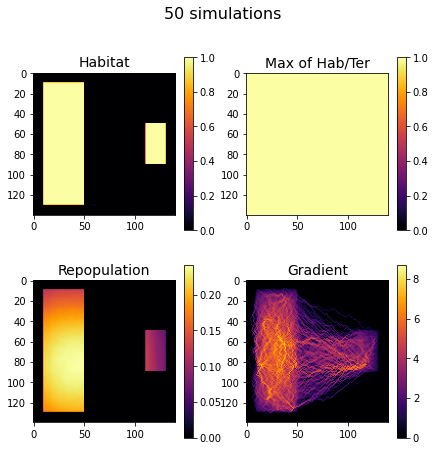

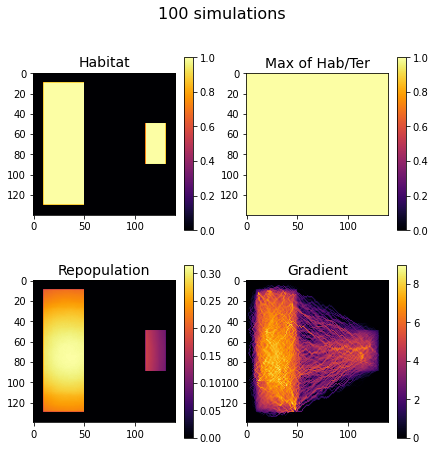

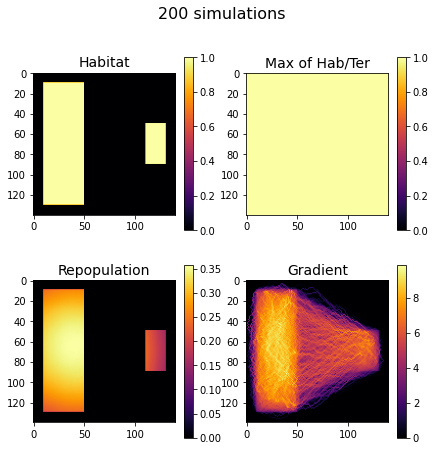

In [ ]:
simulate(hab=hab_2, num_simulations=25, title="25 simulations")
print()
simulate(hab=hab_2, num_simulations=50, title="50 simulations")
print()
simulate(hab=hab_2, num_simulations=100, title="100 simulations")
print()
simulate(hab=hab_2, num_simulations=200, title="200 simulations")

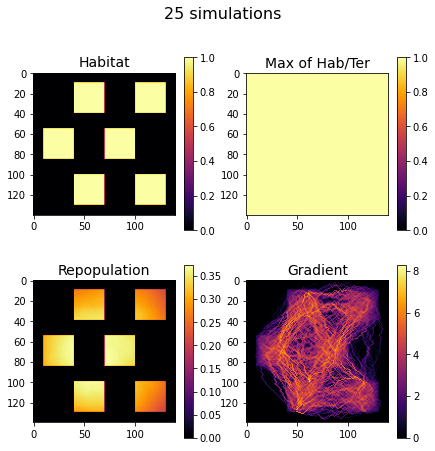

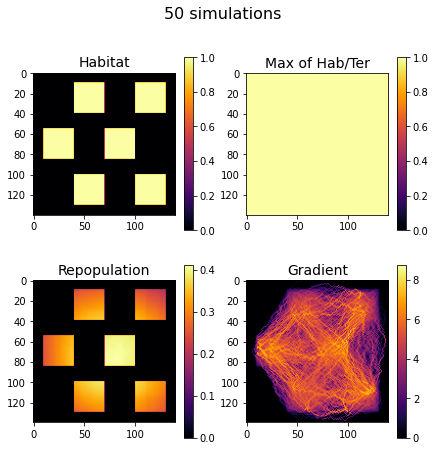

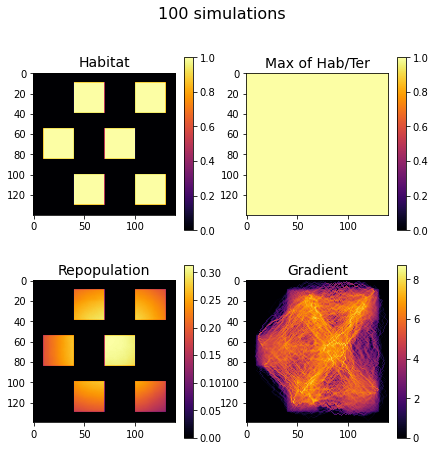

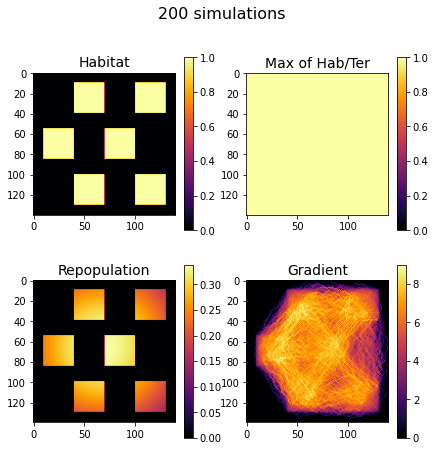

In [ ]:
simulate(hab=hab_6, num_simulations=25, title="25 simulations")
print()
simulate(hab=hab_6, num_simulations=50, title="50 simulations")
print()
simulate(hab=hab_6, num_simulations=100, title="100 simulations")
print()
simulate(hab=hab_6, num_simulations=200, title="200 simulations")

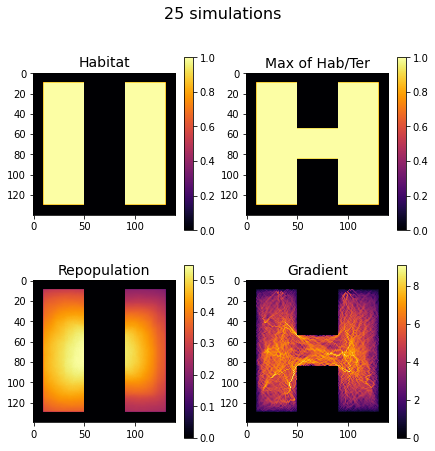

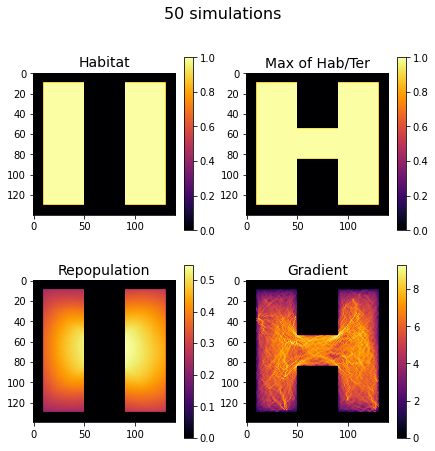

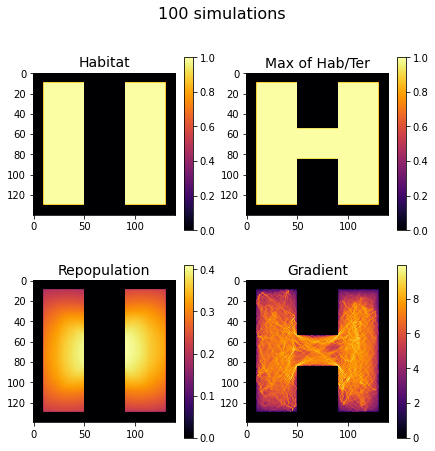

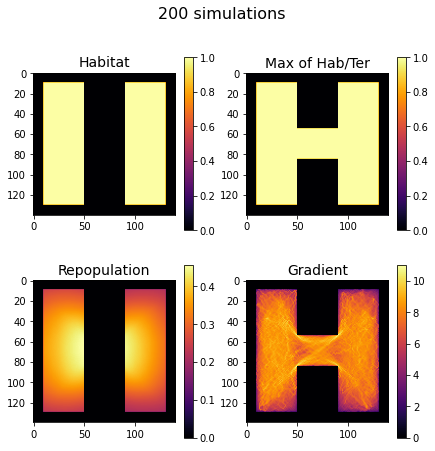

In [ ]:
simulate(ter=ter_2, num_simulations=25, title="25 simulations")
print()
simulate(ter=ter_2, num_simulations=50, title="50 simulations")
print()
simulate(ter=ter_2, num_simulations=100, title="100 simulations")
print()
simulate(ter=ter_2, num_simulations=200, title="200 simulations")

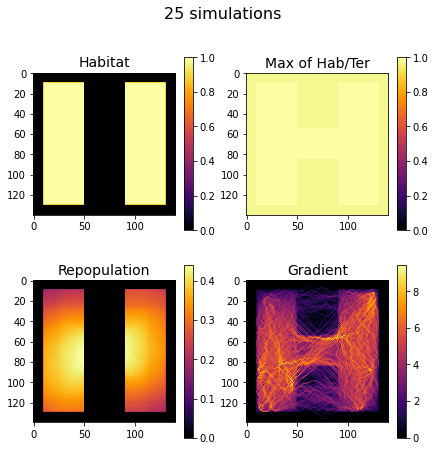

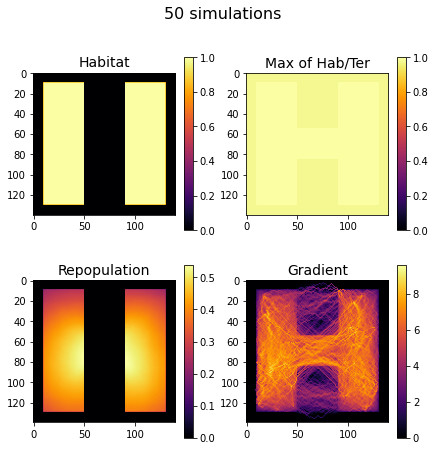

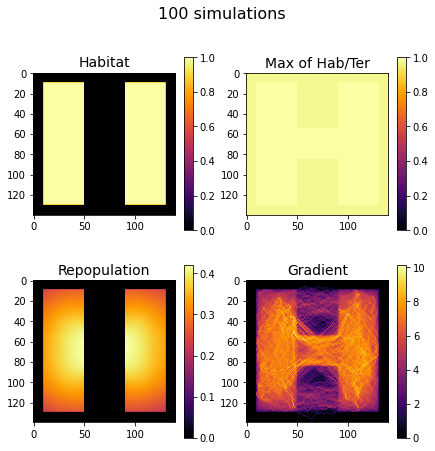

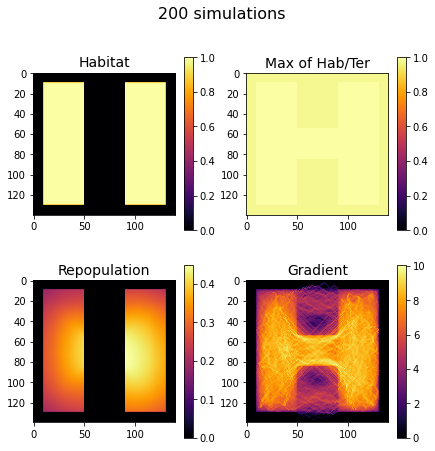

In [ ]:
simulate(ter=ter_5, num_simulations=25, title="25 simulations")
print()
simulate(ter=ter_5, num_simulations=50, title="50 simulations")
print()
simulate(ter=ter_5, num_simulations=100, title="100 simulations")
print()
simulate(ter=ter_5, num_simulations=200, title="200 simulations")

#Distance between patches and utopian comparison

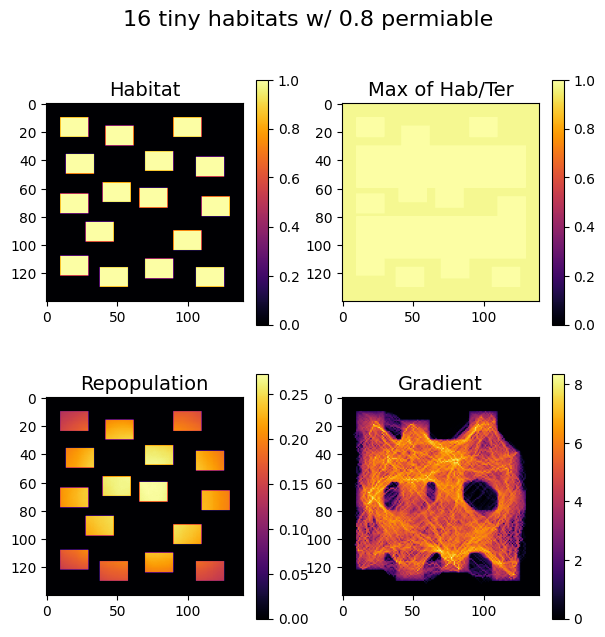

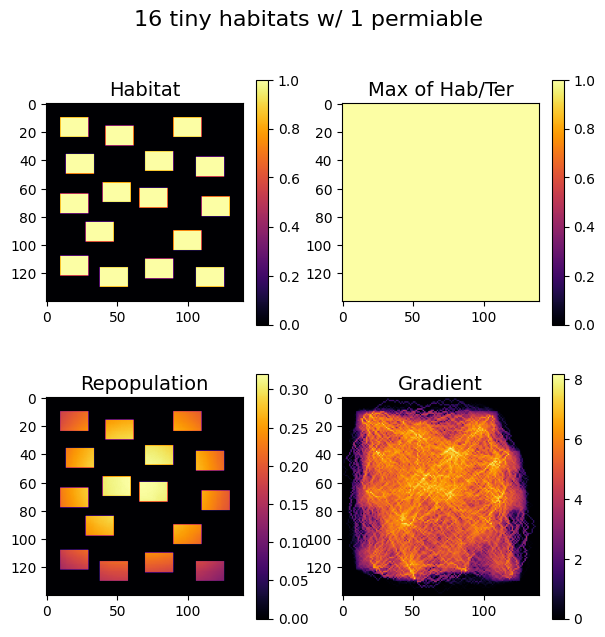

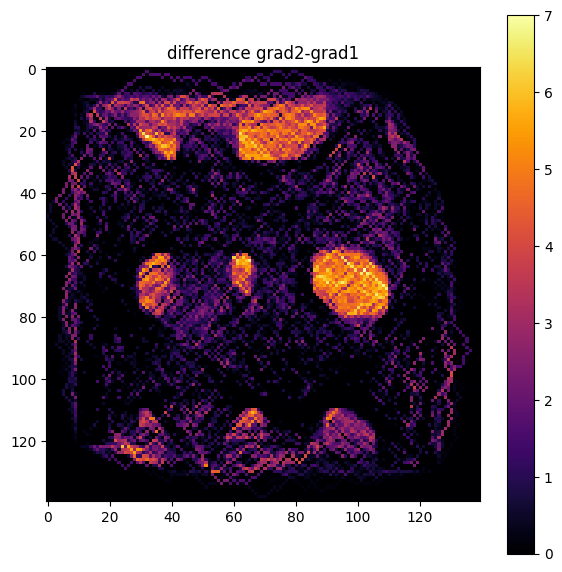

In [ ]:
hab = np.zeros((140, 140))
hab[10:24, 10:30] = 1
hab[16:30, 42:62] = 1
hab[36:50, 14:34] = 1
hab[64:78, 10:30] = 1
hab[56:70, 40:60] = 1
hab[84:98, 28:48] = 1
hab[108:122, 10:30] = 1
hab[116:130, 38:58] = 1
hab[10:24, 90:110] = 1
hab[34:48, 70:90] = 1
hab[38:52, 106:126] = 1
hab[60:74, 66:86] = 1
hab[66:80, 110:130] = 1
hab[90:104, 90:110] = 1
hab[110:124, 70:90] = 1
hab[116:130, 106:126] = 1

repop1, grad1 = simulate(hab=hab, ter=ter_6, title="16 tiny habitats w/ 0.8 permiable")
print()
repop2, grad2 = simulate(hab=hab, ter=ter_1, title="16 tiny habitats w/ 1 permiable")
print()
diff2 = grad2 - grad1
disp(diff2, title=f"difference grad2-grad1")

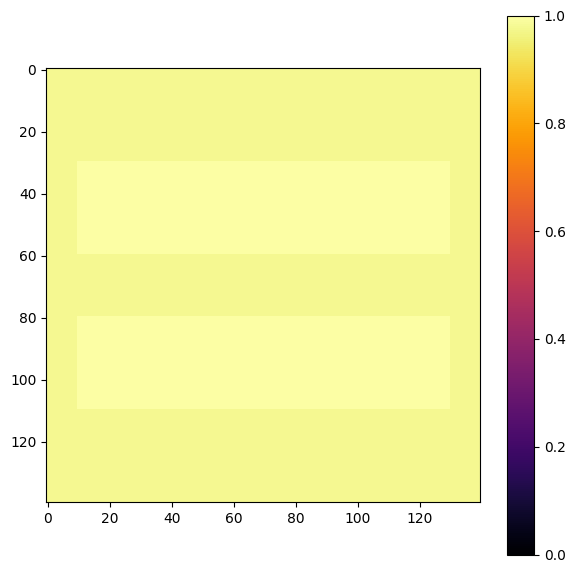

In [ ]:
disp(ter_6)